# Data preprocessing and anlysis


First run s2p- modified version with cropped sides (currently hardcoded) including registration, cell detection and signal extraction  
Then load in sbx files (frames and metadata), load acquisition.mat, load s2p result files

Reference to this notebook to run individual modules- https://colab.research.google.com/github/MouseLand/suite2p/blob/main/jupyter/run_suite2p_colab_2023.ipynb#scrollTo=SABzwikPYsDK

Analysis and ideas  
Current:
- repeat based analysis- replicas from matlab: sort ROI data into repeats (cyclewindow*nstim), plot and cluster
- individual roi based anaylysis- pick out response to each stimulus, identify neurons that are significantly responsive to stimuus (ranksum)  

To do:


In [2]:
import os
from pathlib import Path
import matplotlib.pyplot as plt
from matplotlib import colormaps as cm

import numpy as np

from sbxreader import sbx_get_metadata
from sbxreader import sbx_memmap
from sbxreader import sbx_get_info

import scipy
import pandas as pd
from tqdm import tqdm
from sklearn.preprocessing import minmax_scale

## File loading and preprocessing

### Load files

In [3]:
# load files

# read sbx file and metadata
sbxfile= r'D:\Anne\Data_from_Angelique\Data\020124\08\020124_octo_cal520_000_008.sbx'

this_metadata = sbx_get_metadata(sbxfile)
#print(metadata) # dictionary with the recording metadata

this_info = sbx_get_info(sbxfile)
# load mat file using scipy.io as a matlab_structure

# load acquisition session data
acquisition= scipy.io.loadmat(r'D:\Anne\Data_from_Angelique\Data\020124\08\acq8.mat')

# Load in s2p result files
folder= r'D:\Anne\Data_from_Angelique\Data\020124\08\suite2p\plane0\ops0\\'
F = np.load(os.path.join(folder, 'F.npy'), allow_pickle=True)
Fneu = np.load(os.path.join(folder, 'Fneu.npy'), allow_pickle=True)
#spks = np.load(os.path.join(folder, 'spks_original.npy'), allow_pickle=True)
stat = np.load(os.path.join(folder, 'stat.npy'), allow_pickle=True)
ops =  np.load(os.path.join(folder, 'ops.npy'), allow_pickle=True)
ops = ops.item()
iscell = np.load(os.path.join(folder, 'iscell.npy'), allow_pickle=True)


### Extract stimulus info from metadata and sitmulus aquisition.mat

Outputs  
An array of stimulus identifier with shape= 1, nframe  - stored in variable *stimframe*  
Pandas data frame of stimulus identifier, repetition, and frame windows for each repetition- stored in *stim_pd*


In [4]:
class getdata:
    def __init__(self,metadata, info):
        
        self.resfreq= 7920 # defined by cmn 072519 because it is not 8000 as set in the metadata
        self.framerate= 7920/ info.config.lines
        self.dt= np.round(1/self.framerate, decimals=4)
        # info about frame rates and time in seconds between each frame
        
        self.size= info.sz
        self.nframes= metadata['num_frames']
        # info about x, y and z of image stack
        
        self.event_id= this_metadata['event_id']
        self.frame= this_info.frame
        self.line= this_info.line
        # info about event triggers
        
# create object structure

class configuration: # not useful for now
    def __init__(self, dt, spatialBin, temporalBin):
        self.dt= dt
        self.spatialBin=spatialBin
        self.temporalBin= temporalBin


In [83]:
# config=configuration (0.1, 2, 1)
# set configuratiotions of various pre-processing parameters
# currently not useful

x= getdata(this_metadata, this_info)

In [6]:
# almost exact copy pasta from get2pdata_sbx.m, including the comments

TTL0 = 1
TTL1 = 2
TTLboth =3
# new TTL format, contains both rising and falling

if max(x.event_id)> 3:
    x.event_id[x.event_id==1] = TTL0 # TTL0 rising
    x.event_id[(x.event_id==4)|(x.event_id==8)] = TTL1 # TTL1 rising or falling
    x.event_id[(x.event_id==5)|(x.event_id==9)] = TTLboth # TTL0 rising  + TTL1 rising

stim= np.where((x.event_id==TTL0)|(x.event_id==TTLboth))
fr= (x.frame[stim] + x.line[stim]/796)
# get frame each trigger occured on, add fraction based on line
# ??? not sure if used later

# get phase trigger signals
phasesync= np.where((x.event_id==TTL1)|(x.event_id==TTLboth))
if x.frame[phasesync[0][0]]==0:
    phasesync= phasesync[1:]
    # something funny happens at start giving transition on the first frame
phasesync=phasesync[0][0::2]  #scanbox records rising and falling edge;
fr1= (x.frame[phasesync] + x.line[phasesync]/796) #get frame each trigger occured on,  add on fractio nbased on line
phasetimes= fr1*x.dt
# this is the actual time where each stimulus starts in seconds

# get phase trigger signals
frsync= np.where((x.event_id==TTL0)|(x.event_id==TTLboth))
fr2= (x.frame[frsync] + x.line[frsync]/796)
videoframetimes= fr2*x.dt
#??? not sure if used later

In [7]:
cycLength=np.median(np.diff(phasetimes))/x.dt # number of frames in window around each cycle, min of 4 sec, or actual cycle lengt+2
# so this is the number of frames around each stimulus 

cycwindow= int(np.round(np.max([2/x.dt, cycLength])))
# get the higher value between cycle length (calculated based on 2 seconds), or actual cycle length

In [8]:
startFrame=int(np.round( (phasetimes[0]-1)/x.dt)) # movie starts 1 second before first stim
stimTimes= np.array(np.arange(1,(x.nframes-startFrame-cycwindow-30)*x.dt,cycLength*x.dt)) #make sure you have one cycle, plus 3sec padding to be safe, at end

stimTimesOld = phasetimes-phasetimes[0]+1
stimTimes=stimTimes[stimTimes<np.max(stimTimesOld)]
# Not sure what these two steps does?

ncycles= len(stimTimes)
# total numbers of individual stimulus presented

In [9]:
# to fill in the zeros between stimulus as the previous stimulus. especially important step to process 6x4 on/off stimulus

stimRec_cond=[]
# initiate empty list to store

for count, item in enumerate(acquisition['stimRec']['cond'][0][0]):
    if item ==0:
        stimRec_cond.append(acquisition['stimRec']['cond'][0][0][count-1][0])
    else:
        stimRec_cond.append(item[0])
# so annoying when .mat structure files gets loaded as lits within list within list!!
        

In [10]:
# process acquisition session data

# the way that .mat file are read is very annoying- its arrays within arrays within arrays
stimT=acquisition['stimRec']['ts'][0][0]- acquisition['stimRec']['ts'][0][0][0]
# so variables in acquisition['stimRec'] are in units of frames on the stimulus display (which is x seconds* 60Hz)

# generate a list of stimulus order, found by comparing where the stimulus falls at the begining of each cycle in seconds
stimorder=[]
for i in range(0,ncycles):
    stim_index= np.min(np.where(stimT>((i)*cycLength*x.dt+0.1))[0])
    stimorder.append(stimRec_cond[stim_index])

In [11]:
nstim=np.max(stimorder)
print(f'There are {nstim} different stimulus')

nstimrep=[]
# initiate a list to store reptition of stimulus

for i in np.unique(stimorder):
    this_stim_rep= np.sum(stimorder==i)
    nstimrep.append(this_stim_rep)
    # fill in the list, each stimulus (index) is repeated x times

total_frames= cycLength*nstim
reps= np.floor((x.nframes-startFrame)/total_frames)
print(f'Full stimulation set repeated for {reps} times')

stim_list= list(zip(np.unique(stimorder),nstimrep))
# a combined list where in each row is a stimulus identifier followed by its repetition time

stimframe= np.zeros((x.nframes))
# initiate a array of zeros to a stimulus event for each frame

stim_id= []
stim_rep=[]
stim_start=[]
stim_end=[]
# initiate array to store stimulus identifier and repetition window

for count,element in enumerate(np.unique(stimorder)):
    replist=np.where(stimorder==element)
    # find the corresponding repetition times for this stimulus
    
    for j in np.arange(0, nstimrep[count]):
        # for each repetition, gather the start time, fill in stimulus identifier for the duration of cycle
        start=stimTimes[replist[0][j]]/x.dt
        window_start= np.round(start)+startFrame # dont for get that there are startFrames number of frames before the stimulus actually starts!
        window_end= window_start+ cycwindow-1
        #this_window= np.round(start + np.arange(1,cycwindow))
        stimframe[int(window_start):int(window_end)]=element
        
        stim_id.append(element)
        stim_rep.append(j)
        stim_start.append(int(window_start))
        stim_end.append(int(window_end))


There are 48 different stimulus
Full stimulation set repeated for 6.0 times


In [13]:
import pandas as pd
d={'stim_id':stim_id, 'stim_rep':stim_rep, 'stim_start':stim_start, 'stim_end':stim_end}
stim_pd= pd.DataFrame(d)

In [14]:
stim_pd.sort_values(by='stim_start').head()

,stim_id,stim_rep,stim_start,stim_end
52,10,0,131,150
278,48,0,141,160
218,38,0,152,171
123,22,0,162,181
6,2,0,172,191


In [51]:
stim_pd.sort_values(by='stim_start').tail()

,stim_id,stim_rep,stim_start,stim_end
11,2,5,3005,3024
265,45,5,3016,3035
164,28,5,3026,3045
223,38,5,3036,3055
283,48,5,3047,3066


### Plot identified stuctures and their probability of iscell

Then decide on what is a good iscell threshold

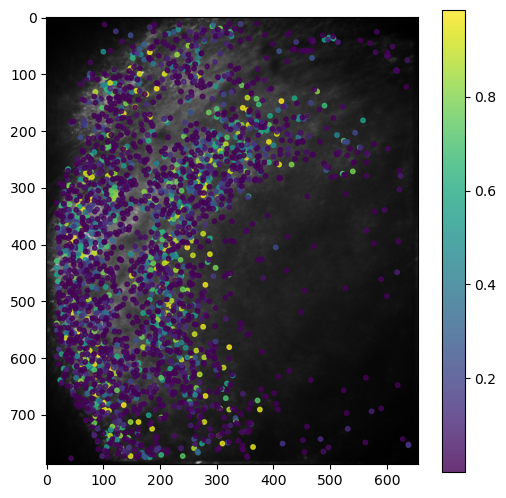

In [16]:
cellstat=stat

center_row= []
center_col = []
prob_cell=iscell.T[1]

for j in cellstat:
    center_row.append( j['med'][0])
    center_col.append( j['med'][1])

fig = plt.figure(figsize=(6, 6))
plt.imshow(ops['meanImg'], cmap='gray')
plt.scatter(center_col,center_row, s= 10, alpha= 0.8, c=prob_cell)
plt.colorbar()

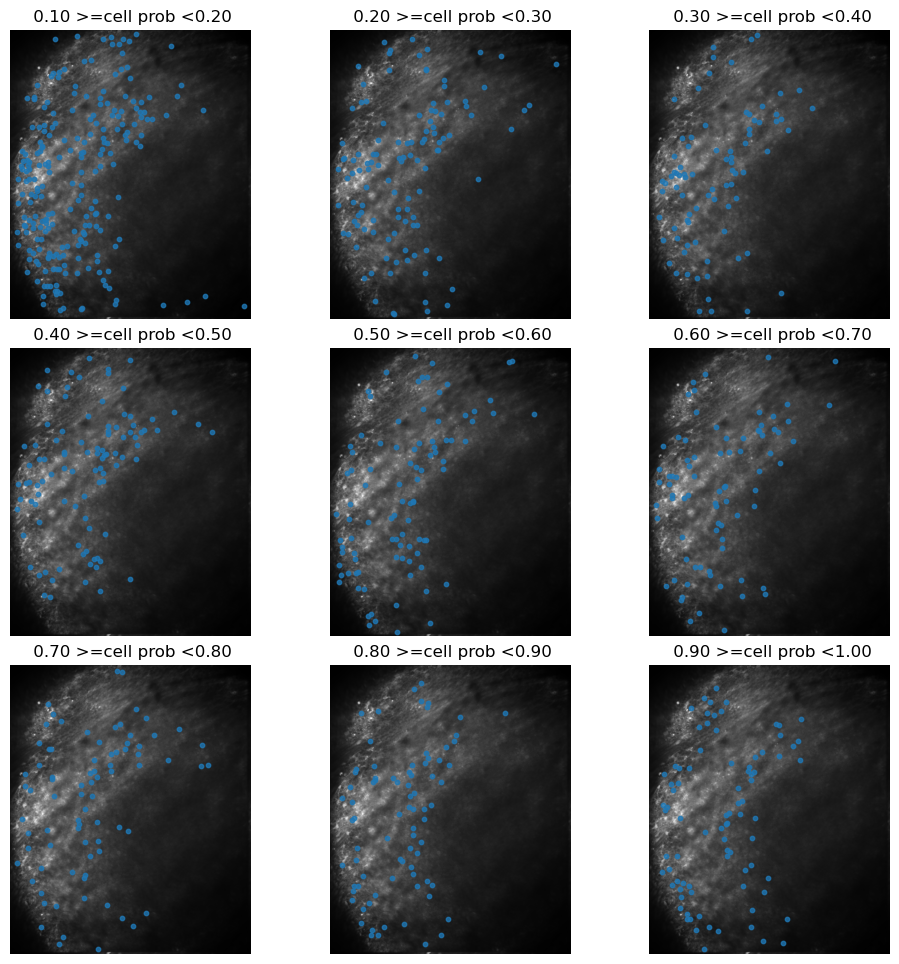

In [17]:
fig, axs = plt.subplots(3,3,figsize=(12,12))
axs=np.ravel(axs)

for count,i in enumerate(np.arange(0.1,1,0.1)):
    this_index= np.argwhere((prob_cell<(i+0.1))&(prob_cell>i))
    cellstat=stat[this_index]

    center_row= []
    center_col = []
    
    for j in cellstat:
        center_row.append( j[0]['med'][0])
        center_col.append( j[0]['med'][1])
    
    axs[count].imshow(ops['meanImg'], cmap='gray')
    axs[count].scatter(center_col,center_row, s= 10, alpha= 0.8)
    axs[count].set_title(f' {i:.2f} >=cell prob <{(i+0.1):.2f}')
    axs[count].axis('off')

axs = np.reshape(axs, (3,3))
plt.subplots_adjust(hspace= 0.1,wspace= 0.1)


In [18]:
iscell_thresh=0.2

selected_index= np.argwhere(prob_cell>iscell_thresh)

print(f'selected iscell threshold is {iscell_thresh}')

selected iscell threshold is 0.2


### Median filter fluorescent trace, extract roi information based on identity (iscell=1 or 0, or both), normalize dye loading 

In [19]:
# median filter fluorescent trace for all rois
F_filtered= scipy.signal.medfilt(F, [1,3])
# median filter of size 3 frame along the 2nd dimension, which is the time series for each roi

In [20]:
# get ROIS that are cells- by the default classifier

#cellid= np.where(iscell[:,0:1]!=0)
#cellF=F_filtered[cellid[0]] # take in only those are cells

#cellF=F_filtered # take all structures

cellF=F_filtered[selected_index.flatten()]
# take cells defined by iscell threshold from previous section

print(f'there are {cellF.shape[0]} cells out of total identified structure {F.shape[0]}')

np.seterr(divide='ignore', invalid='ignore')
# somehow there are cells with fluorescent values = nan...???
# take cares of division by zero cases..

baseline= np.median(cellF, axis=1)
celldff1= (cellF - baseline[:, np.newaxis])/baseline[:, np.newaxis]
# calculate DFF change in fluorescence using median value (to control for amount of dye loading)

celldff=celldff1[~np.isnan(celldff1.min(axis=1))]
# remove traces that was divided by zero

print(f'excluding weird fluorescent traces that have nans as median, the remaining good traces are {celldff.shape[0]}')


there are 714 cells out of total identified structure 2564
excluding weird fluorescent traces that have nans as median, the remaining good traces are 710


Text(0.5, 1.0, 'df/f trace (normalized by mediam) for all 710 rois identified as cell across all frames')

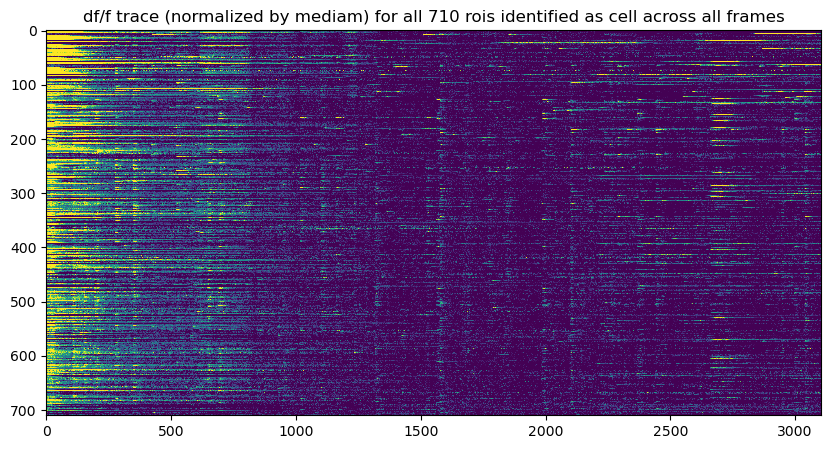

In [21]:
plt.figure(figsize = (10,5))
plt.imshow(celldff, vmin=0, vmax=0.3, aspect='auto',interpolation='none')
plt.title (f'df/f trace (normalized by mediam) for all {celldff.shape[0]} rois identified as cell across all frames')

In [ ]:
# calculate new index of a cell based on previous index
# not super useful but fun to look are nice cells
id_before= 13
id_new= id_before- (iscell[:,0:1]==0 )[:id_before].sum()- (baseline==0 )[:id_before].sum()

id_new

### Associate extracted cell fluorescence with stimulus info - full length
Not so useful except for visualization- ignore for now

In [ ]:
import plotly.graph_objects as go

In [ ]:
testcell= celldff[id_new,:]
# using an interesting test cell?

cleanstimframe=stimframe
cleanstimframe[cleanstimframe==0]=np.nan
# clean up stimframe by replacing timeswith no stimulus (0), typically at begining and end or inbetween stimulus due to rounding

fig, ax1 = plt.subplots(figsize=(12, 6))
color = 'tab:blue'
ax1.set_xlabel('frames')
ax1.set_ylabel('fluorescent', color=color)
ax1.plot( testcell, color=color)
#ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:red'
ax2.set_ylabel('events', color=color)  # we already handled the x-label with ax1
ax2.plot(stimframe, color=color)
#ax2.tick_params(axis='y', labelcolor=color)

plt.title (f'df/f trace (normalized by mediam) for an example roi cross all frames')

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

In [ ]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

frames= list(range(0, cleanstimframe.shape[0]))

# Create traces
fig = make_subplots(specs=[[{"secondary_y": True}]])

fig.add_trace(go.Scatter(x=frames, y=testcell, 
                         mode='lines', 
                         name='Fluorescent'))

fig.add_trace(go.Scatter(x=frames, y=cleanstimframe,
                         mode='markers', 
                         name='Events'),
                         secondary_y=True)

fig.update_layout(hovermode="x", height=800, width=1200, showlegend=False,
                 title="df/f trace (normalized by mediam) for an example roi cross all frames")

fig.show()

In [ ]:
# plot cell response to stimulus in the nth repetition

rep=5
# ie. the 4th repitition

cell_f= np.zeros([np.max(stim_id),cycwindow])

this_event= stim_pd[stim_pd['stim_rep']==rep]
this_event= this_event.reset_index()
for index, row in this_event.iterrows():
    # identify frames that seeing the stimulus for the first time
    cell_f[index,:]=testcell[row['stim_start']:row['stim_end']+1]

x= np.arange(0, cycwindow)
# make x axiss

fig = go.Figure()
for i in range(0,cell_f.shape[0]):
    fig.add_trace(go.Scatter(x=x, y=cell_f[i,:], name= f'stimulus id {i+1}'))

fig.update_layout(legend=dict(y=0.5, traceorder='reversed', font_size=10), title=f'response to all stimulus on reptition{rep}')
fig.show()

In [ ]:
# plot cell response to the same stimulus

id=18
# ie. stimulus identifier 1

this_event= stim_pd[stim_pd['stim_id']==id]
this_event= this_event.reset_index()

cell_f= np.zeros([np.max(this_event.index)+1,cycwindow])

for index, row in this_event.iterrows():
    # identify frames that seeing the stimulus for the first time
    cell_f[index,:]=testcell[row['stim_start']:row['stim_end']+1]

xval=np.arange(0, cycwindow)
# make x axiss

fig = go.Figure()
for i in range(0,cell_f.shape[0]):
    fig.add_trace(go.Scatter(x=xval, y=cell_f[i,:], name= f'stimulus repetition {i}'))

fig.update_layout(legend=dict(y=0.5, traceorder='reversed', font_size=10), title=f'response to stimulus id= {id} on all repetitions')
fig.show()

## Analysis

### Repeat based analysis/ visualizations - replicas from matlab

This section is optional to run - subsequent sections do not depend on output from this portion

#### Sort data into repeats 

In [89]:
dfrepeats=np.zeros([ celldff.shape[0], cycwindow*nstim,int(reps)])+np.nan
print(dfrepeats.shape)
# this is organizes as (cyclewindow* maxstimid,cell,repeat number)
# note that here I only took the number of repetition that included all stimulus (ie. all stimulus is repeated 6 times, not some with 7 times some with 6)

dfrepeats_subtract=np.zeros([ celldff.shape[0], cycwindow*nstim,int(reps)])+np.nan
# another empty array to store data where fluorescent from frame 1 of each cycle is subtracted off for the cycle

(710, 960, 6)


In [90]:
for count,element in enumerate(np.unique(stimorder)):
    replist=np.where(stimorder==element)
    # find the corresponding repetition times for this stimulus
    
    for j in np.arange(0, nstimrep[count]):
        # for each repetition, gather the start time, fill in stimulus identifier for the duration of cycle
        start=stimTimes[replist[0][j]]/x.dt

        window_start= int(np.round(start+1))
        window_end= int(np.round(start + cycwindow))
        #this_window= np.round(start + np.arange(1,cycwindow))
        
        dfrepeats[:,count*cycwindow:count*cycwindow+cycwindow,j]= celldff[:,window_start:window_end+1] 
        dfrepeats_subtract[:,count*cycwindow:count*cycwindow+cycwindow,j]= celldff[:,window_start:window_end+1] - celldff[:,window_start][:,np.newaxis]

# calculate df/f of each cycle by subtracting the intensity at the first time point from the cycle trace. 
# The reslice data into n cellx cycle*stim x nrep

C:\Users\Anne\AppData\Local\Temp\ipykernel_15224\4156088579.py:1: RuntimeWarning: Mean of empty slice
  all_cells= np.nanmean(dfrepeats,axis=0)
C:\Users\Anne\AppData\Local\Temp\ipykernel_15224\4156088579.py:2: RuntimeWarning: Mean of empty slice
  all_cells_subtract= np.nanmean(dfrepeats_subtract,axis=0)


(960, 6)


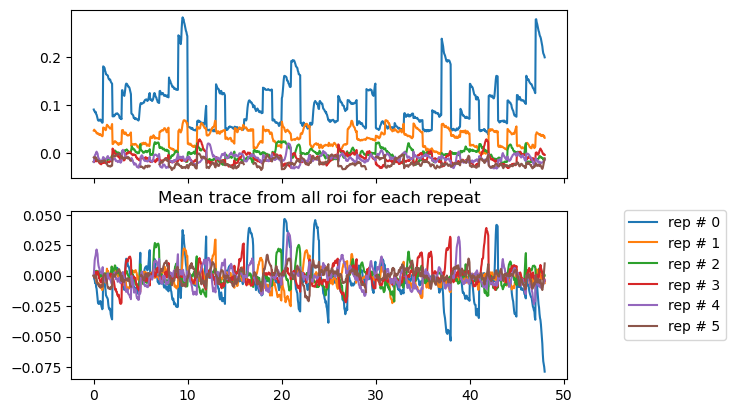

In [88]:
all_cells= np.nanmean(dfrepeats,axis=0)
all_cells_subtract= np.nanmean(dfrepeats_subtract,axis=0)

print(all_cells.shape)
#this the average trace from all ROIs across each repetition

fig, axs = plt.subplots(2, sharex=True)

xval=np.arange(0, dfrepeats.shape[1])

for i in range(0,all_cells.shape[1]):
    axs[0].plot(xval/cycwindow, all_cells[:,i], label=f'rep # {i}')

for i in xval[::cycwindow] :
    axs[0].plot([i/cycwindow, i/cycwindow], [all_cells.min(), all_cells.max()], lw=0.5, ls='--')

plt.title('Mean trace from all roi for each repeat')

for i in range(0,all_cells.shape[1]):
    axs[1].plot(xval/cycwindow, all_cells_subtract[:,i], label=f'rep # {i}')

for i in xval[::cycwindow] :
    axs[1].plot([i/cycwindow, i/cycwindow], [all_cells_subtract.min(), all_cells_subtract.max()], lw=0.5, ls='--')

plt.legend(loc='best',bbox_to_anchor=(1.1, 1.05))

plt.show()

In [ ]:
# this_cell=152
# this_trace= dfrepeats_subtract[this_cell,:,:-1]

# plt.figure()
# plt.plot(this_trace)
# plt.plot(np.mean(this_trace,axis=1), color='k')
# plt.title(f'Mean trace from all roi # {this_cell} for each repeat')
# plt.show()

#### Cluster cells 

In [91]:
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
import seaborn as sns

In [94]:
# get median from each repeat
dfrepeats_median=np.nanmedian(dfrepeats_subtract,axis=2)
dfrepeats_median.shape

(710, 960)

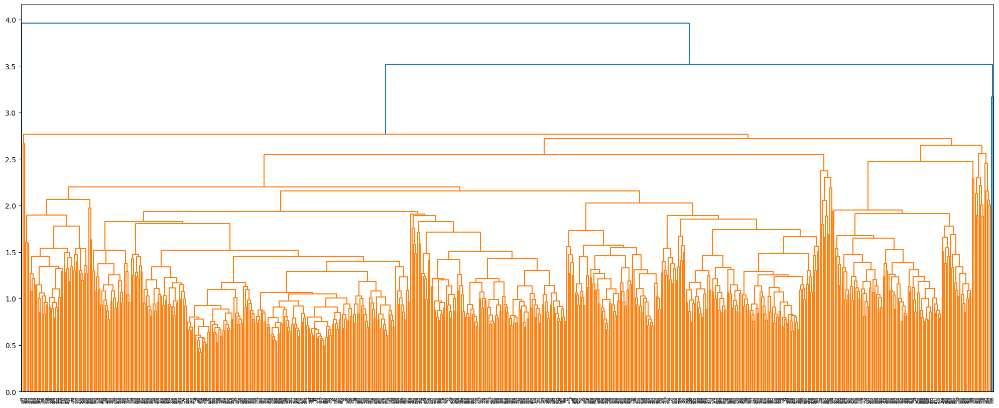

In [111]:
Z = linkage(dfrepeats_median, 'ward')
fig = plt.figure(figsize=(25, 10))
dn = dendrogram(Z)

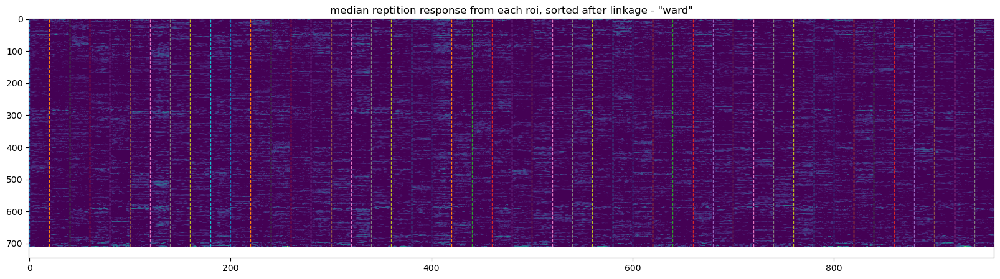

In [96]:
ordered_idx = list(map(int, dn['ivl']))
# convert the rearranged indices in string to intergers to reorder our signal

plt.figure(figsize = (20,5))
plt.imshow(dfrepeats_median[ordered_idx], aspect='auto', vmin=-0, vmax=0.2)
x=np.arange(0, dfrepeats_median.shape[1],cycwindow)
for i in x:
    plt.plot([i, i], [0, dfrepeats_median.shape[0]],lw=1, ls='--')

plt.title('median reptition response from each roi, sorted after linkage - "ward"')
plt.show()


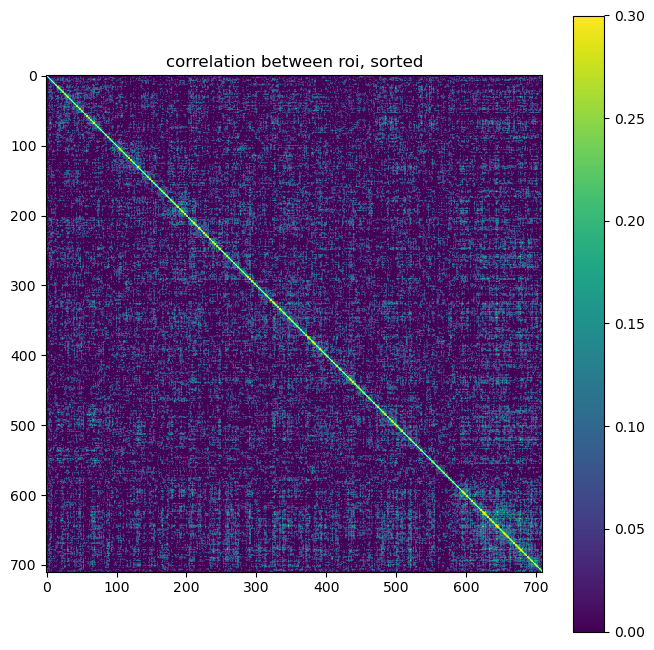

In [65]:
plt.figure(figsize = (8,8))
corr= plt.imshow(np.corrcoef(dfrepeats_median[ordered_idx]), aspect='1', vmin=-0, vmax=0.3)
fig.colorbar(corr)
plt.title('correlation between roi, sorted')
plt.show()

D:\Anaconda\envs\2p-analysis\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


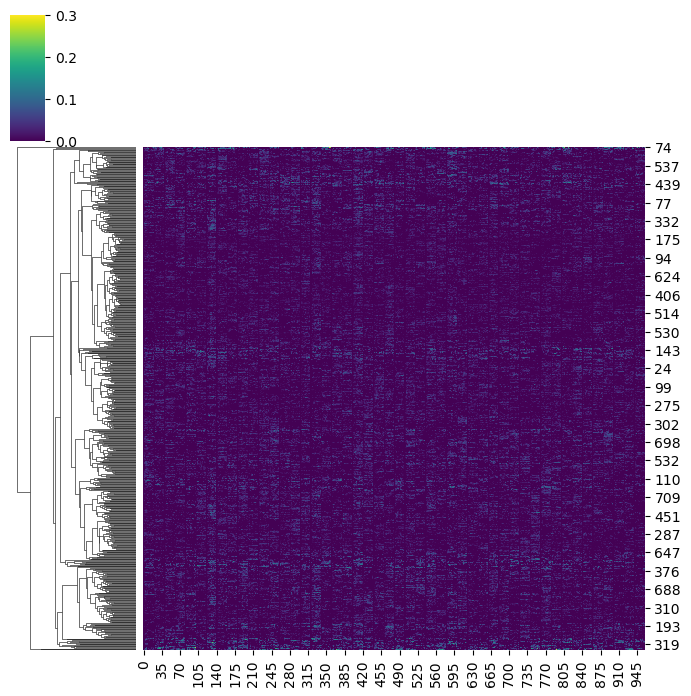

In [97]:
# repetition median across stimulus sequence

sns.clustermap(
    dfrepeats_median,
    figsize=(7,7),
    method='ward',
    row_cluster=True,
    col_cluster=False,
    cmap='viridis',
    vmin=0,
    vmax= 0.3
)

Text(0.5, 1.0, 'mean_Image')

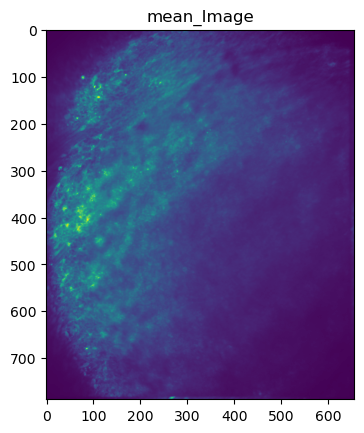

In [98]:
plt.imshow(ops['meanImg'])
#ops['meanImg'].shape
plt.title('mean_Image')

In [99]:
#cellstat=stat[cellid[0]]
# get stats for only structures that are cells

#cellstat=stat
# stats from all structures

cellstat=stat[selected_index.flatten()]
# stat from structures pre-selected (ie. by a defined threshold of iscell probability)

cellstat=cellstat[~np.isnan(celldff1.min(axis=1))]
# also remove those indices that were dividing by zero during our celldff process



In [100]:
cellstat.shape

(710,)

In [106]:
big_cluster= fcluster(Z, t=2.7, criterion='distance')

print(f'number of arbitrary cluster= {big_cluster.max()}')
# cut cluster

number of arbitrary cluster= 6


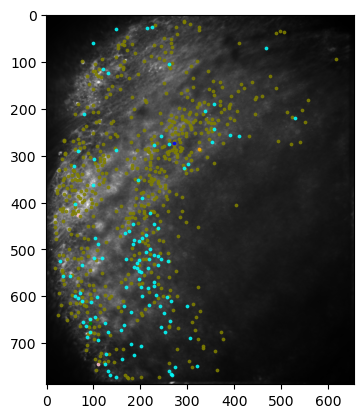

In [107]:
for i in range(1,big_cluster.max()+1):
    cluster_cells= cellstat[big_cluster==i]
    
    center_row= []
    center_col = []
    c=['pink', 'olive', 'cyan','blue', 'orange', 'green', 'red', 'purple', 'brown']
    
    for j in cluster_cells:
        center_row.append( j['med'][0])
        center_col.append( j['med'][1])
        
    plt.imshow(ops['meanImg'], cmap='gray')
    plt.scatter(center_col, center_row, s= 3, alpha= 0.8, c= c[i-1])

#### info on each individual clusters

C:\Users\Anne\AppData\Local\Temp\ipykernel_15224\3376433137.py:8: RuntimeWarning: Mean of empty slice
  cluster_celldfs_mean= np.nanmean(cluster_celldfs,axis=0)


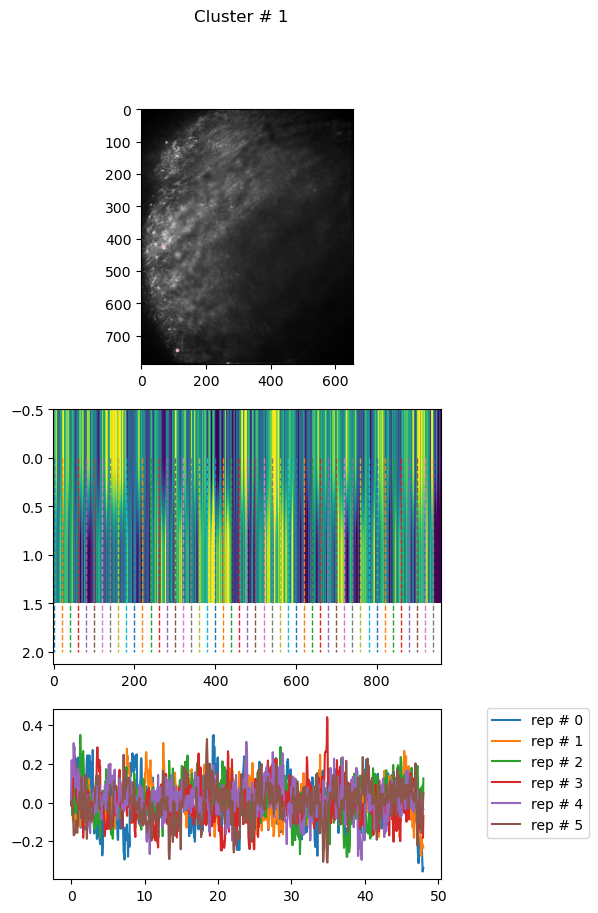

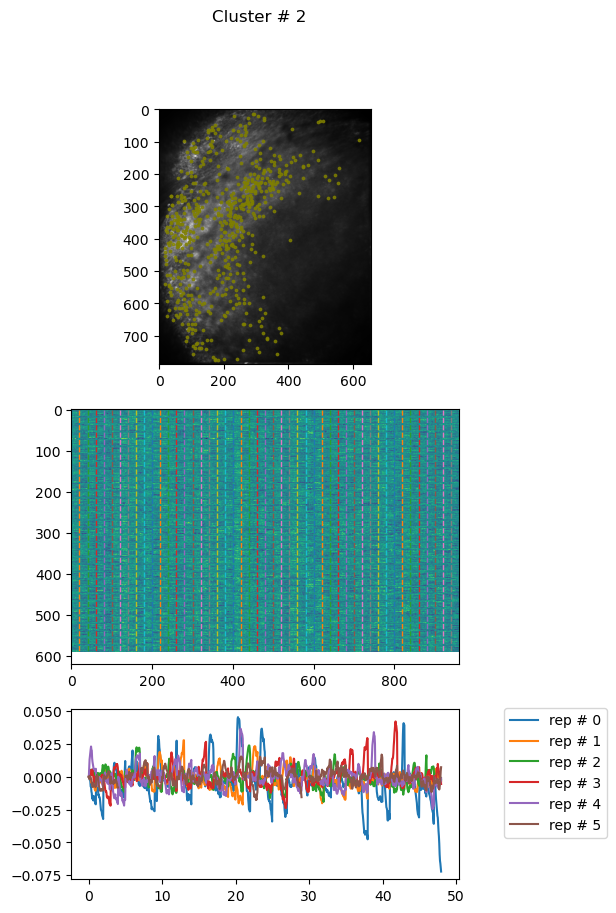

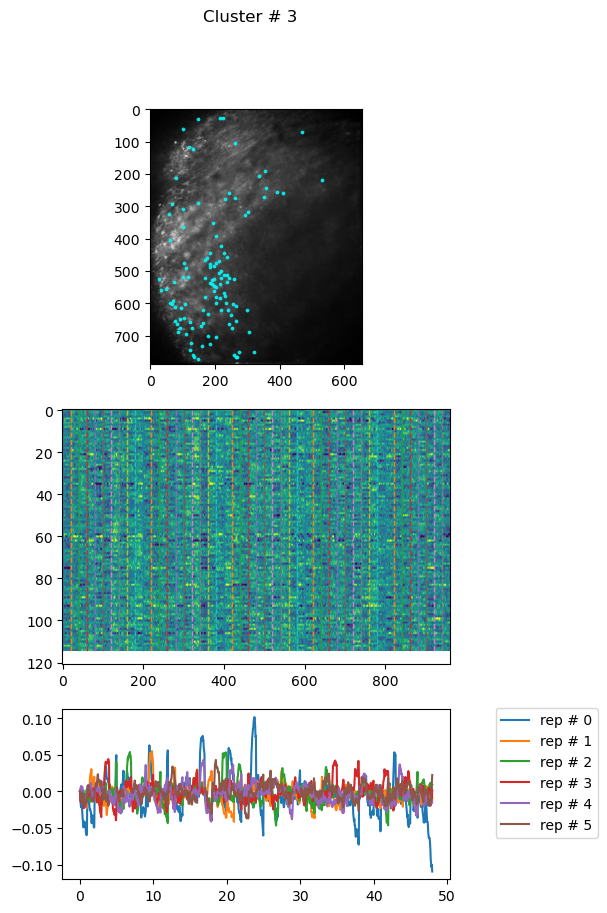

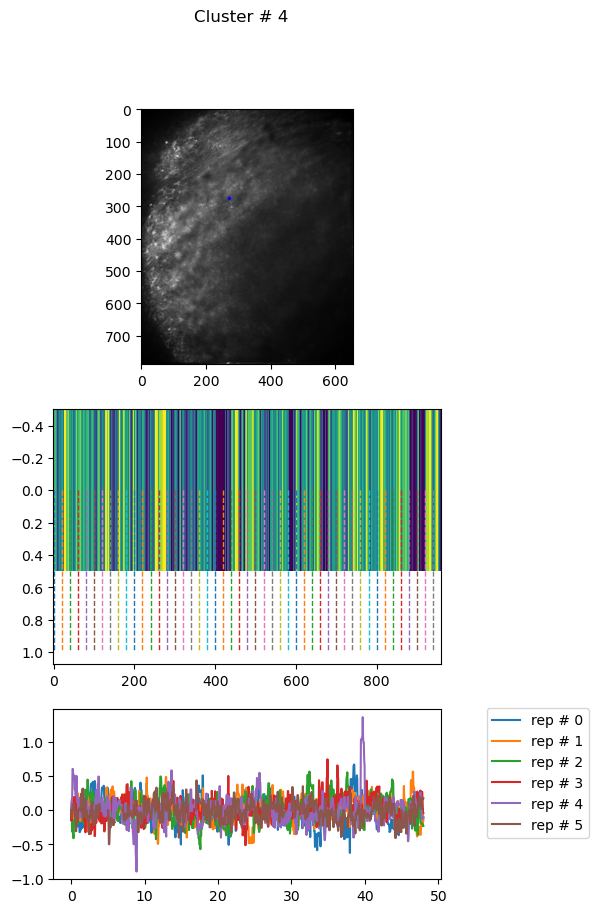

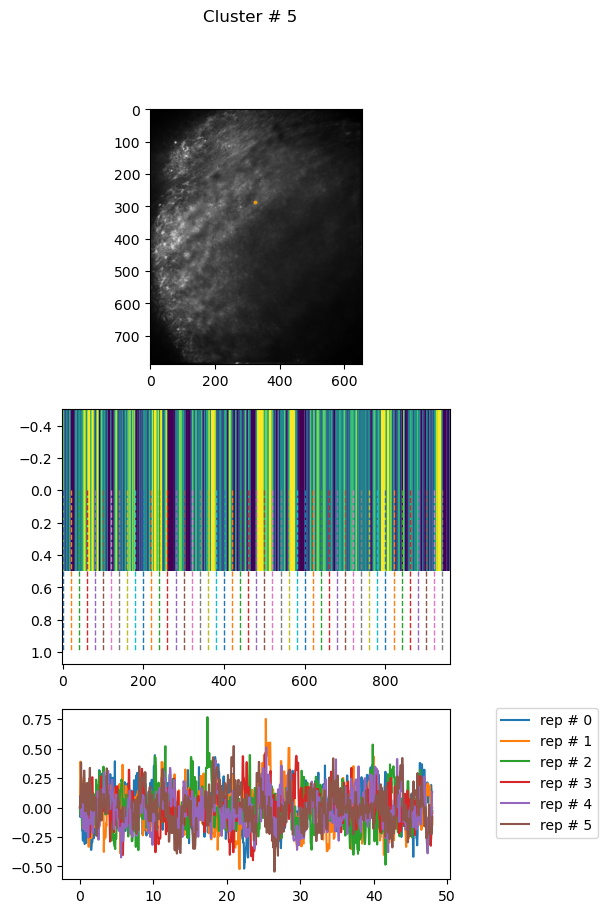

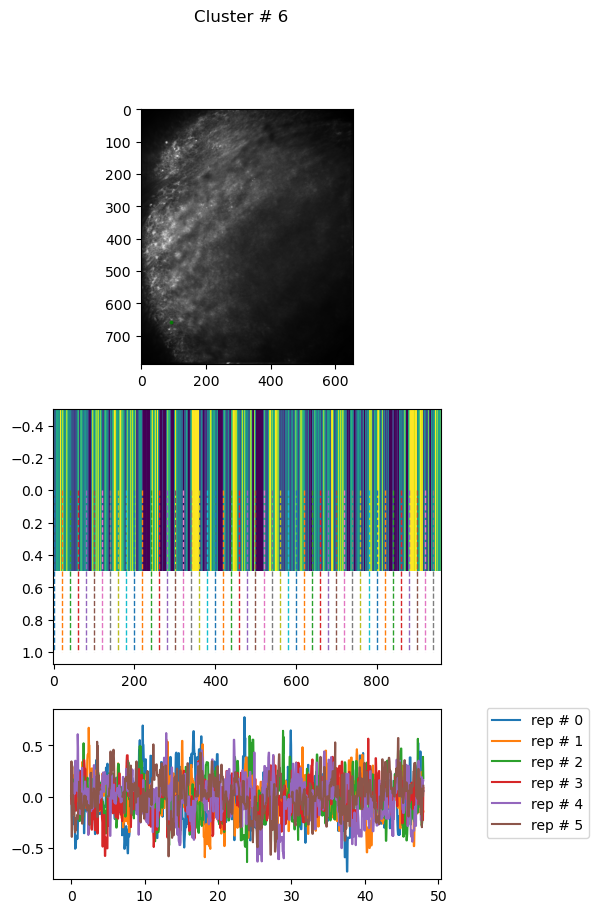

In [108]:
for i in range(1,big_cluster.max()+1):
    cluster_cells= cellstat[big_cluster==i]
    cluster_celldfs= dfrepeats_subtract[big_cluster==i]

    cluster_celldfs_median=np.nanmedian(cluster_celldfs,axis=2)
    # compute median along the reptitions for each cell, plot in ax[1]

    cluster_celldfs_mean= np.nanmean(cluster_celldfs,axis=0) 
    # compute mean along all cells for each repitition, plot on ax[0]
    
    fig, axs = plt.subplots(3,1, figsize=(5,10),  height_ratios=[3,3,2])
    # create 4 subplots

    center_row= []
    center_col = []
    
    for j in cluster_cells:
        center_row.append( j['med'][0])
        center_col.append( j['med'][1])
        
    axs[0].imshow(ops['meanImg'], cmap='gray')
    axs[0].scatter(center_col, center_row, s= 3, alpha= 0.8, c= c[i-1])
    
    axs[1].imshow(cluster_celldfs_median, aspect='auto', vmin=-0.1, vmax=0.1)
    
    x=np.arange(0, cluster_celldfs_median.shape[1],cycwindow)
    for k in x:
        axs[1].plot([k, k], [0,cluster_celldfs_median.shape[0]],lw=1, ls='--')

    #axs[1,0]= plt.plot(cluster_celldfs)

    xval=np.arange(0, dfrepeats.shape[1])
    for k in range(0, cluster_celldfs.shape[2]):
        axs[2].plot(xval/cycwindow, cluster_celldfs_mean[:,k], label=f'rep # {k}')

    for k in xval[::cycwindow] :
        axs[2].plot([k/cycwindow, k/cycwindow], [cluster_celldfs_mean.min(), cluster_celldfs_mean.max()], lw=0.5, ls='--')

    fig.suptitle(f'Cluster # {i}')
    plt.legend(loc='best',bbox_to_anchor=(1.1, 1.05))


### Associating stimulus id onto ACTUAL stimulus parameter

#### nstim== 17, gratings

Analysis/ representations associated with 8 way gratings at 2 spatial frequencies + full field stimulus

color_dict: stimulation of the same orientation have the same color  
style_dict: dashed line (sf 0.01), dotted line (sf 0.16), solid line (full field) 

Orientation defined by two properties- bar appearance (4 possible appearance), and motion direction (8 vectors)


In [ ]:
if nstim== 17:
    stimsession= 'Gratings'
    print(f'Current stimulus type: {stimsession}, total numbers of stimulus: {nstim}')

    orient=acquisition['orient']
    orient=np.append(orient, np.nan)
    # the last stimulus for this type of stimulus session is a full field flash, so append nan for orientation
    
    freq=acquisition['freq']
    freq=np.append(freq, np.nan)
    # the last stimulus for this type of stimulus session is a full field flash, so append nan for spatial frequency

d= {'stim_id': np.unique(stimorder), 'orientation':orient, 'spatial_frequency':freq}
stim_detail= pd.DataFrame(d)


In [61]:
# create velocity vectors - reduces the orientation dimension but adds a third dimension
direction_dict= {'orientation': [0, 45,90,135,180,225,270,315],
                 'direction_x': [1,1,0,-1,-1,-1,0,1,],
                 'direction_y': [0,1,1,1,0,-1,-1,-1]
                }

#stimu_detail['direction']= stim_detail.map(direction_dict)

In [62]:
direction_pd= pd.DataFrame(data=direction_dict)
stim_detail= pd.merge(stim_detail, direction_pd, on='orientation', how='left')

In [63]:
stim_detail

,stim_id,orientation,spatial_frequency,direction_x,direction_y
0,1,0.0,0.01,1.0,0.0
1,2,0.0,0.16,1.0,0.0
2,3,45.0,0.01,1.0,1.0
3,4,45.0,0.16,1.0,1.0
4,5,90.0,0.01,0.0,1.0
5,6,90.0,0.16,0.0,1.0
6,7,135.0,0.01,-1.0,1.0
7,8,135.0,0.16,-1.0,1.0
8,9,180.0,0.01,-1.0,0.0
9,10,180.0,0.16,-1.0,0.0


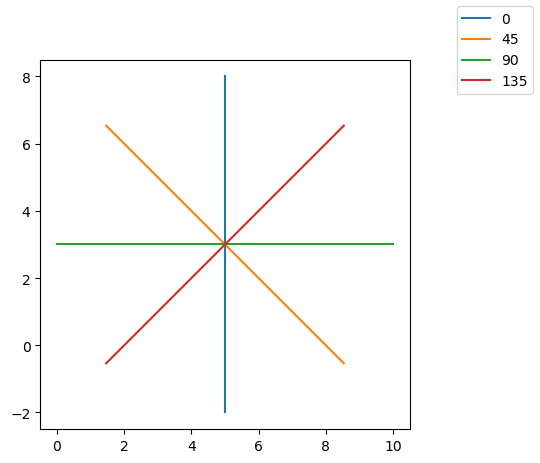

In [64]:
# generate some sort of representation for these stimulus
center = [5, 3]
L = np.array([-5, 5]) # length of line

fig, ax = plt.subplots()
ax.set_aspect(1)
for a in range(0, 180, 45):
    phi = np.deg2rad(a+90) # so that degree 0 is vertical 
    x = center[0] + np.cos(phi) * L
    y = center[1] + np.sin(phi) * L
    ax.plot(x, y, label=f'{a}')
fig.legend()

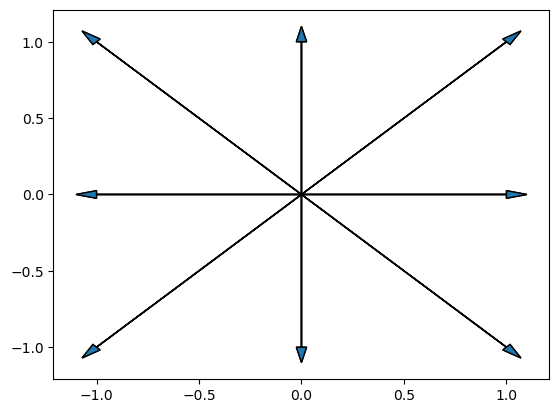

In [65]:
for i in range(0, len(stim_detail)):
    
    this_x= stim_detail.iloc[i].direction_x 
    this_y= stim_detail.iloc[i].direction_y 

    plt.arrow(0,0,this_x,this_y,head_width=0.05, head_length=0.1)

In [66]:
# 

cmap=cm['Accent'].colors

color_dict= np.repeat(cmap,2,axis=0)
color_dict=np.append(color_dict,[[0.1,0.1,0.1]], axis=0)
# assign colors to stimulus- stimulus with same orientation gets same color, black as full field flash

style_dict= ['dashed','dotted','dashed','dotted','dashed','dotted','dashed','dotted','dashed','dotted','dashed','dotted','dashed','dotted','dashed','dotted','solid']
# assign line style as indications of spacial frequency- dashed correspond to sf= 0.01, dotted sf=0.16, solid line as full field flash

In [67]:
cmap = cm['hsv']
color_dict_cyc= cmap(np.linspace(0, 1, 8)) # select 8 colors evenly spaced across the entire hsv colormap
color_dict_cyc= np.repeat(color_dict_cyc,2,axis=0)
color_dict_cyc=np.append(color_dict_cyc,[[0.1,0.1,0,0.1]], axis=0)
# assign colors to stimulus- stimulus with same orientation gets same color, black as full field flash


In [ ]:
# test for color bar
x= np.arange(0,17)
y=x

plt.scatter(x,y,c=color_dict_cyc)
plt.colorbar()
plt.show()

In [ ]:
# Some ideas for comparisons between stimulus
# in the 8 way grating stimulus, we have 8 orientations(bars moving in 8 different directions ie, L to R or R to L are two directions) and 2 spatial frequencies
# could compare between spatial frequency for the same orientation 
# could also compare same spatial frequency for the same bar stimulus but moving at different directions (ie O and 180)
# could also compare same spatial frequency for two different orientation (ie. 0 and 90)

In [69]:
# compare each orientation but for different spatial frequency

id_list1= []

for i in np.unique(stim_detail.orientation):
    try:
        int(i)
        # for the 8 way gratings, the final stimulus id 17 is a full field flash, so orientation and frequency = nan
    except: 
        pass
    else:
        this_orientation= stim_detail[stim_detail['orientation']==i]
        id_list1.append([this_orientation.spatial_frequency.index[0], this_orientation.spatial_frequency.index[1]])
# these are the pairs of stimulus with the same orientation but different spatial frequency

print(f' Pairs of stimulus ID with the same orientation but different stimulus')
print(id_list1)

 Pairs of stimulus ID with the same orientation but different stimulus
[[0, 1], [2, 3], [4, 5], [6, 7], [8, 9], [10, 11], [12, 13], [14, 15]]


In [70]:
# compare same spatial frequency for the same bar stimulus but moving at different directions (ie O and 180)

id_list2= []

for element in np.unique(stim_detail[:-1].spatial_frequency):
    # here instead of try and except statement, just not consider the last row which is the full field flash where orientation and frequency =nan

    for j in np.unique(stim_detail[:-1].orientation):
        
            pair_id1= stim_detail[(stim_detail['spatial_frequency']== element) & (stim_detail['orientation']==j)].index
            pair_id2= stim_detail[(stim_detail['spatial_frequency']== element) & (stim_detail['orientation']==j+180)].index
            
            if j+180 >= 360:
                # so stop when the first orientation gets to 180
                pass
            else: 
                id_list2.append([pair_id1.values[0], pair_id2.values[0]])

# these are the pairs of stimulus with the orientation 180 degrees apart but with same spatial frequency -> so just comparing between motion direction

print(f' Pairs of stimulus ID with the same spatial frequency but orientation 180 degrees apart (ie. bars look the same but direction of motion opposite)')
print(id_list2)

 Pairs of stimulus ID with the same spatial frequency but orientation 180 degrees apart (ie. bars look the same but direction of motion opposite)
[[0, 8], [2, 10], [4, 12], [6, 14], [1, 9], [3, 11], [5, 13], [7, 15]]


In [ ]:
# compare same spatial frequency for bar orientation that are orthogonal- 90 degrees apart
# ie. 0 and 90, 0 and 270, 

WORK IN PROGRESS
id_list3= []

for element in np.unique(stim_detail[:-1].spatial_frequency):
    # here instead of try and except statement, just not consider the last row which is the full field flash where orientation and frequency =nan

    for j in np.unique(stim_detail[:-1].orientation):
        
            pair_id1= stim_detail[(stim_detail['spatial_frequency']== element) & (stim_detail['orientation']==j)].index
            pair_id2= stim_detail[(stim_detail['spatial_frequency']== element) & (stim_detail['orientation']==j+90)].index
            
            if j+180 >= 360:
                pass
            else: 
                id_list3=.append([pair_id1.values[0], pair_id2.values[0]])

# these are the pairs of stimulus with the orientation 90 degrees apart but with same spatial frequency -> so just comparing between motion direction
print(f' Pairs of stimulus ID with the same spatial frequency but orientation 180 degrees apart (ie. bars look the same but direction of motion opposite)')
print(id_list3)

#### n== 48, 6x4 stimulus for retinotopy 

6 different X positions and 4 different y positions, with possible contrast -1 or 1. Thus a total of 6x 4 x2 =48 stimulus

color_dict: stimulation of the same X position have same color  
style_dict: represents contrast, dashed line (-1, 'OFF'),solid line (1, 'ON')  
alpha_dict: alpha represents different y positions, more transparent means smaller y position

In [177]:
if nstim== 48:
    stimsession= '4 x 6 ON/OFF stimulus'
    print(f'Current stimulus type: {stimsession}, total numbers of stimulus: {nstim}')
    
    positionX=acquisition['positionX'].flatten()
    positionY=acquisition['positionY'].flatten()
    contrast=acquisition['contrast'].flatten()
    # where -1 is off and 1 is on..?

d= {'stim_id': np.unique(stimorder), 'positionX':positionX, 'positionY':positionY, 'contrast':contrast}
stim_detail= pd.DataFrame(d)
stim_detail.head()

Current stimulus type: 4 x 6 ON/OFF stimulus, total numbers of stimulus: 48


,stim_id,positionX,positionY,contrast
0,1,-25,-15,-1
1,2,-25,-5,-1
2,3,-25,5,-1
3,4,-25,15,-1
4,5,-15,-15,-1


In [604]:
# define color map and linestyles for plotting
# assign colors to stimulus- stimulus with different x position vary by color color, stimulus  position y varies by alpha value

cmap=cm['Accent'].colors
color_dict_temp= np.repeat(cmap[0:6],4,axis=0) # take the first 6 colors (pos X change), and each repeat four times (posY change)
color_dict= np.concatenate((color_dict_temp, color_dict_temp))

style_dict= ['dashed'] *24 + ['solid']* 24
# assign line style as indications contrast, with dashed = -1 and solid = 1

alpha_dict=(0.1,0.4,0.7,1)*12
# four transparency level,  smaller (negative) y position correspond to more transparent, largest y position is not transparent

marker_dict= ['_']*24+['P']*24
# markder style represents off(-) or on (+) stimulus

In [605]:
stim_detail.head()

,stim_id,positionX,positionY,contrast
0,1,-25,-15,-1
1,2,-25,-5,-1
2,3,-25,5,-1
3,4,-25,15,-1
4,5,-15,-15,-1


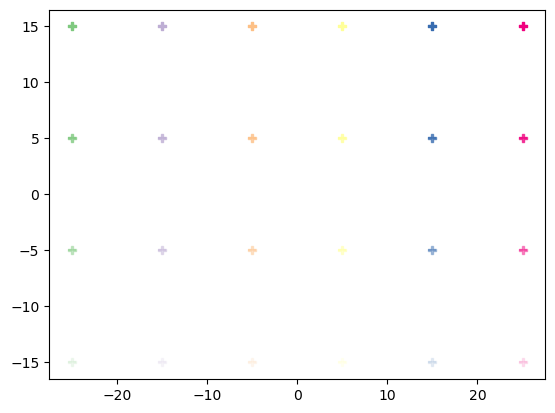

In [606]:
for i in range(0, len(stim_detail)):
    plt.scatter(stim_detail.iloc[i].positionX, stim_detail.iloc[i].positionY, color= color_dict[i], alpha=alpha_dict[i], marker=marker_dict[i])

In [ ]:
id_list1= []

work in progress

posX=np.unique(positionX)
poxY=np.unique(positionY)


### Looking at individual rois and their responsese to each stimulus
calculate evoked response by doing df/f using first 5 frames of each cycle as baseline and the 10th to 20th frames as evoked window

#### prepare data

In [112]:
reorganized_trace= np.zeros((celldff.shape[0],cycwindow-1, nstim, int(reps)))+np.nan
# create storage to store mean images at a given stimulus at a given repetition
print(f'cell dff trace array reorganized to {reorganized_trace.shape}, with ncells, cycwindow-1, stim_id, repitition')

cell dff trace array reorganized to (710, 19, 48, 6), with ncells, cycwindow-1, stim_id, repitition


In [178]:
# extract evoked responses based on pre-defined periods

offset= -10 
# hard coded in matlab version, give 10 frames buffer in front of each cycle

baseRange=range(0,5)
# take the first five frame as the baseline

evRange= range(9,19)
# take the 9th through 19th frame as evoked activity

for count, element in enumerate(tqdm(np.unique(stim_id))):
    for j in range(0, nstimrep[count]):
        
        this_pd= stim_pd[(stim_pd['stim_id']==element) & (stim_pd['stim_rep']==j)]
        this_trace= celldff[:, this_pd['stim_start'].values[0]+offset : this_pd['stim_end'].values[0]+ offset]
        # grab relevant frames for a given stimulus at a given repetition

        this_baseline= np.nanmean(this_trace[:, baseRange], axis=1)

        trace_evoked= this_trace - this_baseline[:,np.newaxis]
        # calculate evoked image by using evoked frame ranges and baseline frame ranges, then mean this these frames
        
        reorganized_trace[:,:,count,j]= trace_evoked
        # store into storage
        

100%|█████████████████████████████████████████████████████████████████████████████████| 48/48 [00:00<00:00, 369.68it/s]


In [179]:
avg_stim_trace= np.nanmean(reorganized_trace, axis= 3)
# trace for each stimulus- averaged across all repititions
avg_stim_trace.shape

(710, 19, 48)

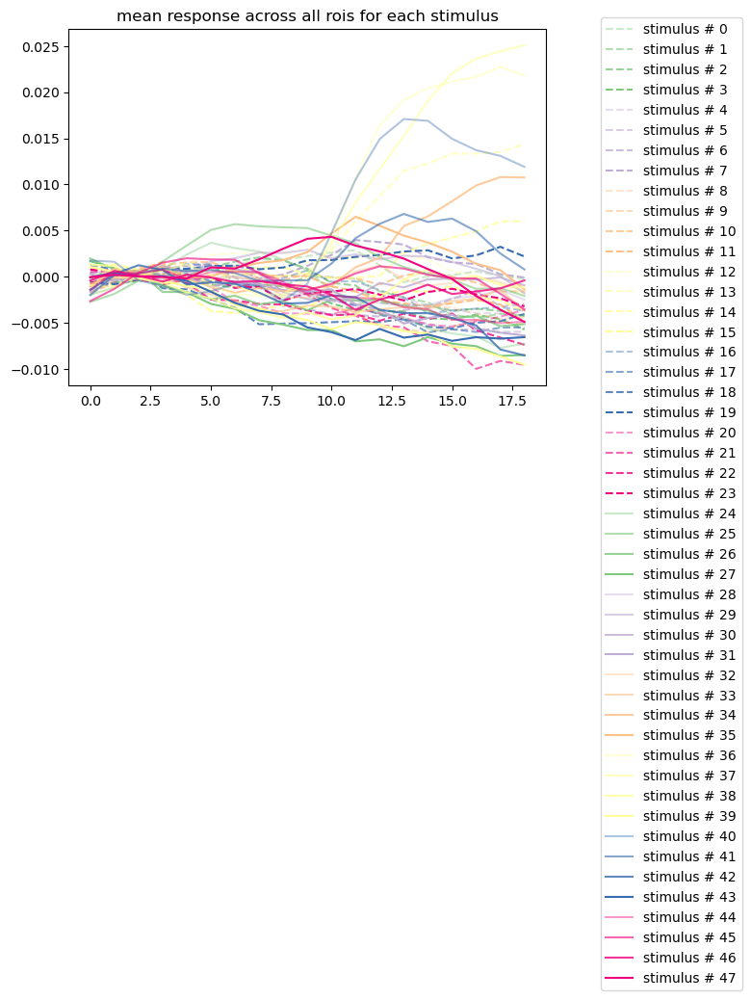

In [180]:
for i in np.arange(0,avg_stim_trace.shape[2]):
    plt.plot(np.mean(avg_stim_trace[:,:,i], axis=0), label=f'stimulus # {i}',color= color_dict[i], linestyle= style_dict[i], alpha= alpha_dict[i])
plt.title('mean response across all rois for each stimulus')
plt.legend(loc='best',bbox_to_anchor=(1.1, 1.05))
plt.show()

Some ideas on what to do next..  

Identify responsive cells for each stimuli..?  
One tailed Wilcoxon rank-sum test to test if two samples are from the same distribution -DONE- both increase and decrease
- ie compare traces during baseline and traces during response window for each neuron
- _The Wilcoxon rank-sum test tests the null hypothesis that two sets of measurements are drawn from the same distribution. The alternative hypothesis is that values in one sample are more likely to be larger than the values in the other sample._
- like a non-parametric version of t-test  

One more ranksum to determine the stimuli specificity of rois identified above to different stimulus parameter (sf, orientation, motion direction)??
- ROI 'preference'
- ie. for each roi, compare values within response windows of all stimulus sf=0.16 with those for sf=0.01

decode stimulus condition using roi responses? 
- ie decode the spatial frequency of a given trial using model trained on neural data from a subset of trials? ie. use the first half of the stimulus that contains both sf but only half of the orientation (bars look the same but motion different)
- use all neurons or a subset of rois- predefined by some metrics..ie. significantly modulated ones?
- decode other stimulus properties

#### find stimulus responsive neurons

In [190]:
def find_responsive(trace, base_range,evo_range, tail='greater'):

    ''' inputs dfof trace that is rearranged as (ncells, cycwindow-1, stim_id, repitition), base frame range and evoked frame range, and tail ('greater' or 'less')
    '''

    response_matrix= np.zeros((trace.shape[0],trace.shape[2]))
    # create empty array with shape (nroi, nstim)
    
    for i in tqdm(range(0,trace.shape[2])):
    # loop over different stimulus
    
        for j in range(0,reorganized_trace.shape[0]):
        # loop over different rois
            bl_measures= trace[j,base_range,i,:]
            evo_measures= trace[j,evo_range,i,:]
            ranksums= scipy.stats.ranksums (evo_measures.flatten(),bl_measures.flatten(), alternative=tail)
    
        # record wether this roi during evoked response period is significantly greater than during baseline period determined by the ranksums test
            if ranksums.pvalue <(0.05/nstim): # Bonferroni correction to control for multiple comparisons
            #if compare large enough numbers of features then there is morelikely that something will appear difference by chance
                response_matrix[j,i]=1 # assign those fall below p value as 1
        else:
            pass
    
    return response_matrix


In [192]:
# arrange data for wilcoxon rank sum test
# Find neurons that have greater responses during the evoked window than baseline

print('calculating rois that are positively modulated by each stimuli')
responsive_inc=find_responsive(reorganized_trace, baseRange, evRange, tail='greater')

print('calculating rois that are negatively modulated by each stimuli')
responsive_dec=find_responsive(reorganized_trace, baseRange, evRange, tail='less')

calculating rois that are positively modulated by each stimuli


100%|██████████████████████████████████████████████████████████████████████████████████| 48/48 [00:15<00:00,  3.01it/s]


calculating rois that are negatively modulated by each stimuli


100%|██████████████████████████████████████████████████████████████████████████████████| 48/48 [00:16<00:00,  2.99it/s]


In [201]:
responsive_dec.shape
# this is an array indicating whether each roi is identified as responsive to a given stimulus
# should have shape nroi x nstim

(710, 48)

Text(0.5, 0.98, 'Mean ROI response for each stimulus- only rois that significantly modulated  by stimulus 13')

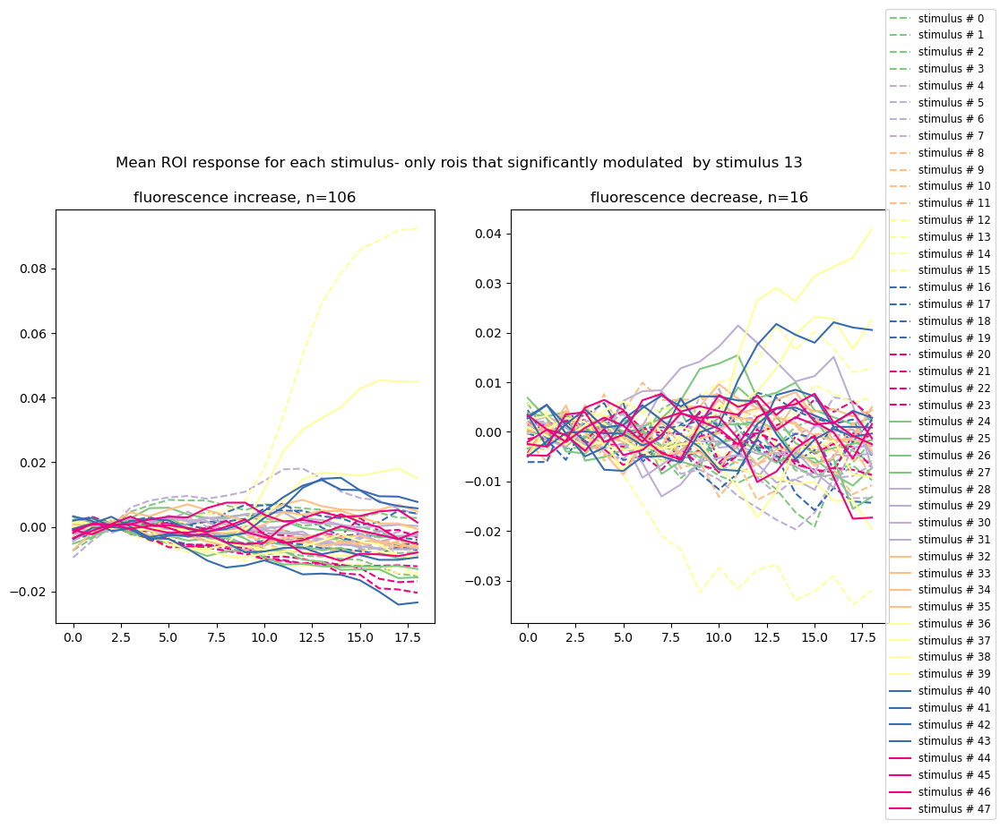

In [196]:
fig, axs = plt.subplots(1,2,figsize=(12,6))

this_stimulus=13
this_responsive= np.argwhere(responsive_inc[:,this_stimulus])
#avg_stim_trace_inc= np.mean(np.squeeze(reorganized_trace[this_responsive, :,:,:]), axis= 3)
avg_stim_trace_inc= avg_stim_trace[this_responsive.flatten(),:,:]

for i in np.arange(0,avg_stim_trace_inc.shape[2]):
    axs[0].plot(np.mean(avg_stim_trace_inc[:,:,i], axis=0), label=f'stimulus # {i}',color= color_dict[i], linestyle= style_dict[i])
axs[0].set_title(f'fluorescence increase, n={this_responsive.shape[0]}')

this_responsive= np.argwhere(responsive_dec[:,this_stimulus])
avg_stim_trace_dec= avg_stim_trace[this_responsive.flatten(),:,:]

for i in np.arange(0,avg_stim_trace_dec.shape[2]):
    axs[1].plot(np.mean(avg_stim_trace_dec[:,:,i], axis=0),color= color_dict[i], linestyle= style_dict[i])
axs[1].set_title(f'fluorescence decrease, n={this_responsive.shape[0]}')

fig.legend(fontsize= 'small', loc='center right')
fig.suptitle(f'Mean ROI response for each stimulus- only rois that significantly modulated  by stimulus {this_stimulus}')

Text(0.5, 0.98, 'distribution of # neurons that are modulated to x# of stimulus')

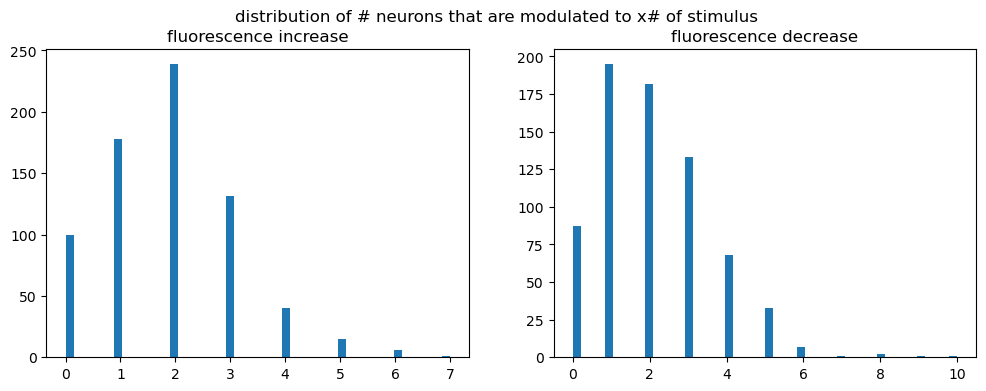

In [195]:
#### Distribution of ROI and # of their response to stimulus

fig, axs = plt.subplots(1,2,figsize=(12,4))

axs[0].hist(np.sum(responsive_inc,axis=1), bins=nstim)
axs[0].set_title('fluorescence increase')
axs[1].hist(np.sum(responsive_dec,axis=1), bins=nstim)
axs[1].set_title('fluorescence decrease')

fig.suptitle(f'distribution of # neurons that are modulated to x# of stimulus')

#### What stimulus combination do roi clusters care about?
Data driven approach (?)  
Does not pre-define stimulus pairs/groups but let the ROIs tell us - this is essentially clustering based on tuning curve

TO DO:
- need to add error bars properly

In [227]:
# Run clustering based on responsive types- concatenate both increase and decrease responses

from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
import seaborn as sns


In [228]:
# keep responsive increase and responsive decrease orthogonal during clustering
# ie. input array is nroi x (1 nstimulus) but increase is +1, decrease is -1, not significant =0

cluster_input_responsive=responsive_inc+(responsive_dec*-1)
print(f'prepare array for clustering based on significant response  - {cluster_input_responsive.shape}, which is n structure * (nstimulus), for increase(1) and decrease(-1) in fluorescent upon stimulus')

prepare array for clustering based on significant response  - (710, 48), which is n structure * (nstimulus), for increase(1) and decrease(-1) in fluorescent upon stimulus


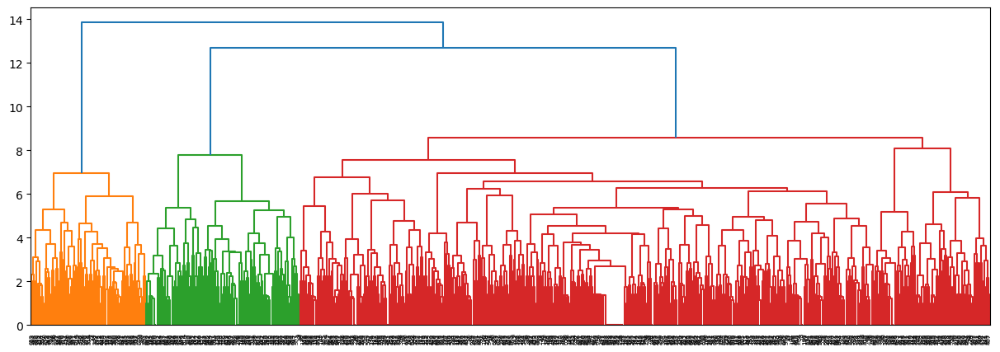

In [229]:
Z = linkage(cluster_input_responsive, 'ward')
fig = plt.figure(figsize=(15, 5))
dn = dendrogram(Z)

D:\Anaconda\envs\2p-analysis\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


Text(0.5, 1.0, 'whether each unit is significant to a stimulus or not')

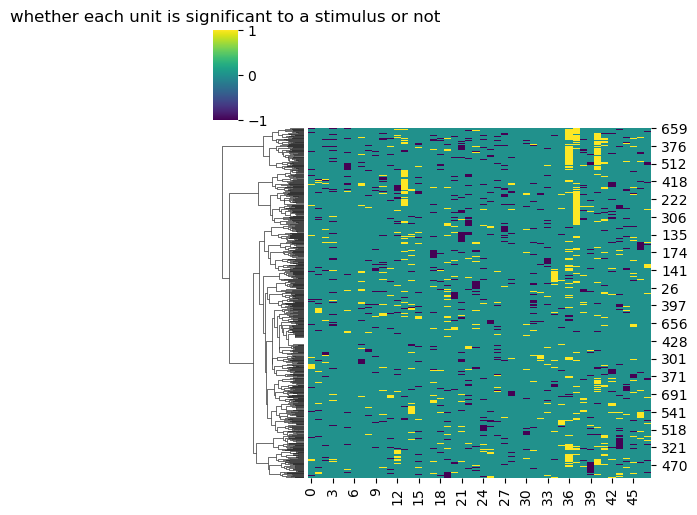

In [230]:
sns.clustermap(
    cluster_input_responsive,
    figsize=(5,5),
    method='ward',
    row_cluster=True,
    col_cluster=False,
    cmap='viridis')
plt.title('whether each unit is significant to a stimulus or not')

In [232]:
big_cluster= fcluster(Z, t=8, criterion='distance')

print(f'number of arbitrary cluster= {big_cluster.max()}')
# cut cluster

number of arbitrary cluster= 5


Text(0.5, 1.0, 'Clustering based on stimulus significance result')

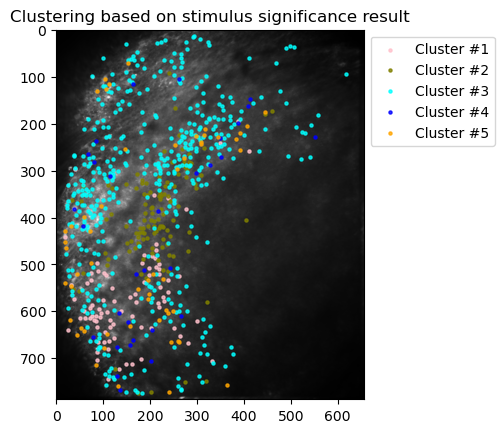

In [233]:
for i in range(1,big_cluster.max()+1):
    cluster_cells= cellstat[big_cluster==i]
    
    center_row= []
    center_col = []
    c=['pink', 'olive', 'cyan','blue', 'orange', 'green', 'red', 'purple', 'brown']
    
    for j in cluster_cells:
        center_row.append( j['med'][0])
        center_col.append( j['med'][1])
        
    plt.imshow(ops['meanImg'], cmap='gray')
    plt.scatter(center_col, center_row, s= 5, alpha= 0.8, c= c[i-1], label=f'Cluster #{i}')
plt.legend(loc='best',bbox_to_anchor=(1, 1))
plt.title('Clustering based on stimulus significance result')

For the next plots  
Red line and dashed lines in scatter plot- mean and std for shuffled data (permuted for nroi times - number of rois within this cluster) as a control  
Which stimulus pattern could be obtained at 'chance level'

In [665]:
# define useful functions for data-preparation and plotting

def permute_cluster_response(cluster_response, npermute):
    ''' 
    Permute an array of cluster_response of shape nrois x response for npermute numbers of time.
    each row is permuted npermute numbers of time and the average is noted in a temporary array
    the final average across averages and std of all nroi is stored as chance_mean and chance_std

    '''
    cluster_response_chance= np.zeros((cluster_response.shape[1], npermute)) # create empty array to hold sample shuffling
    
    for j in range(0, npermute):
        cluster_response_chance[:,j]=np.mean(rng.permutation(cluster_response, axis=1), axis=0)
    # permute sample x times along the nstim axis

    chance_mean=np.mean(cluster_response_chance, axis=1) # compute mean response strength for shuffled data
    chance_std= np.std(cluster_response_chance, axis=1) # compute std response strength for shuffled data
    
    return chance_mean, chance_std

def arrange_cluster_df(cluster_response, chance_mean,chance_std):
    ''' 
    calculate cluster mean, standard deviation, compares cluster mean with chance_mean plus or minus chance_std
    stores cluster mean, cluster std, and 'weights' of important stimulus in a data frame
    'weights' of important stimulus- differences for cluster means that are above and chance_mean+std and those that are below chance_mean-std
    '''
    cluster_mean= np.mean(cluster_response, axis=0)
    cluster_std=np.std(cluster_response, axis=0)
    
    dif_care_response= cluster_mean- (chance_mean + chance_std)
    dif_care_response[dif_care_response<0]=0 # assign zero for all those differences that are smaller than the mean+ std
    #dif_care_response= dif_care_response.reshape(2,nstim) # reshape to 2 x nstim array so the second set is for sig decrease in fluorescence
    
    dif_notcare_response= cluster_mean- (chance_mean - chance_std)
    dif_notcare_response[dif_notcare_response>0]=0 # assign zero for all those differences that are greater than the mean- std
    #dif_notcare_response= dif_notcare_response.reshape(2,nstim)
    # currently dif_dec_response is not being plotted
    
    cluster_df=stim_detail.copy()
    cluster_df['response_mean']= cluster_mean
    cluster_df['response_std']= cluster_std

    
    cluster_df['care_sig_inc_weight']= dif_care_response
    cluster_df['care_sig_dec_weight']= dif_notcare_response
    
    return cluster_df

def plot_bar_appearance(cluster_df, col='',axs=None, cmap=cm['Accent'].colors):
    ''' for 8 way gratings
    Plot what the bar look like for each stimulus that is important to the roi
    need to specify which column to use (ie. care_sig_inc_weight) and to plot on which axs
    '''

    # generate some sort of representation for these stimulus
    center = [5, 3]
    L = np.array([-5, 5]) # length of line
    temp=this_clusterpd.groupby(by='orientation').sum().reset_index() # sum up weights that belong to the same orientation regardless of spatial frequency
    #cmap=cm['Accent'].colors

    for i in range(0, len(temp)):
        phi = np.deg2rad(temp.iloc[i].orientation+90) # so that degree 0 is vertical 
        x = center[0] + np.cos(phi) * L
        y = center[1] + np.sin(phi) * L
    
        this_weight= temp.iloc[i][col]
        axs.plot(x, y, linewidth=this_weight*50, color=cmap[i],alpha=0.75,
                    label=f'{temp.iloc[i].orientation}')        
    return

def plot_direction(cluster_df,col='',axs=None, cmap=cm['Accent'].colors):
    ''' for 8 way gratings 
    Plot what the motion direction like for each stimulus that is important to the roi
    need to specify which column to use (ie. care_sig_inc_weight) and to plot on which axs
    '''    
    temp=this_clusterpd.groupby(by='orientation').sum().reset_index() # sum up weights that belong to the same orientation regardless of spatial frequency
    #cmap=cm['Accent'].colors
    for i in range(0, len(temp)):
        
        this_x= temp.iloc[i].direction_x 
        this_y= temp.iloc[i].direction_y 
    
        this_weight= temp.iloc[i][col]
    
        axs.arrow(0,0,this_x,this_y, head_width=np.abs(this_weight), linewidth=this_weight*20, color=cmap[i],
                     label=f'motion_vector= {this_x,this_y},  {temp.iloc[i].orientation} ') 
    
    return

def plot_amp_ev(celldf, evoked_range, axs=None):
    ''' calculate mean amplitude during evoked period of each unit for each stimulus
    Input cell fluorescent traces, arranged as nroi x nframes(in a cycle) x stimulus
    '''
    stim_resp_amp=[]
    stim_resp_sem=[]
    
    for i in range(0, celldf.shape[2]):
        cluster_fevmean=np.mean(cluster_celldfs[:,evoked_range, i], axis=1)
        # calculate mean fluorescent during the evoked frames for each units in this cluster
        
        stim_resp_amp.append(np.mean(cluster_fevmean))
        stim_resp_sem.append(np.std(cluster_fevmean)/np.sqrt(cluster_celldfs.shape[0]))
    
    axs.bar(xval, stim_resp_amp, color=color_dict, yerr=stim_resp_std)

    return


def plot_scatter_kde_all(df,axs=None):
    ''' for 6x4
    plots scatter plot on locations- positionX, position Y, with size of marker the weight of response
    approximate a kernel density estimation based on the weights
    positive weight-  red, negative weight blue
    '''
    weight_positive= df['response_mean'].copy()
    weight_positive[weight_positive<0]=0
    
    weight_negative= df['response_mean'].copy()
    weight_negative[weight_positive>0]=0
    
    axs.scatter(x=df["positionX"], y=df["positionY"], s=20, c='k', alpha= 0.2, marker='x')
    # plot all possible locations, using x as markers
    
    axs.scatter(x=df["positionX"], y=df["positionY"], s=weight_positive*500, c=color_dict[0:24], edgecolors='k',marker='^')
    #plot only significant locations, using circles and size represents the mean responsive weight
    sns.kdeplot(data=df, x='positionX', y='positionY', weights=weight_positive, cmap="rocket", levels=5, thresh=0.4, ax=axs)
    
    axs.scatter(x=df["positionX"], y=df["positionY"], s=abs(weight_negative)*500, c=color_dict[0:24], edgecolors='k',marker='v')
    #plot only significant locations, using circles and size represents the mean responsive weight
    sns.kdeplot(data=df, x='positionX', y='positionY', weights=np.abs(weight_negative), cmap="mako", levels=5, thresh=0.4, ax=axs)

    return 

def plot_scatter_sig(df,axs=None):
    ''' for 6x4
    plots scatter plot on locations- for those that are significant only!
    - positionX, position Y, with size of marker the weight of response
    positive weight-  red, negative weight blue
    '''
    
    axs.scatter(x=df["positionX"], y=df["positionY"], s=20, c='k', alpha= 0.2, marker='x')
    # plot all possible locations, using x as markers
    
    axs.scatter(x=df["positionX"], y=df["positionY"], s=df['care_sig_inc_weight']*500, c=color_dict[0:24], edgecolors='k', marker='^', label='above')
    #plot only significant locations, using circles and size represents the mean responsive weight
    
    axs.scatter(x=df["positionX"], y=df["positionY"], s=np.abs(df['care_sig_dec_weight'])*500, c=color_dict[0:24], edgecolors='k', marker='v', label='below')
    #plot only significant locations, using circles and size represents the mean responsive weight

    return 


In [237]:
# prepare data for the next plots

mean_cluster_response= np.mean(cluster_input_responsive, axis=0)
mean_cluster_response.shape[0]

rng = np.random.default_rng() # initialize rng generator

xval=np.arange(0, mean_cluster_response.shape[0]) # create x variables for scatter plot
temp= np.arange(0,mean_cluster_response.shape[0]/2) #convert x value to stimulus index (ie, stimulus 34 is actually still stimulus 17 but those show decrease response toward this stimulus)
#x_labels= np.repeat(temp[np.newaxis,:], 2, axis=0).flatten() 


##### plotting for 8 way grating

In [ ]:

for i in range(1,big_cluster.max()+1):

    # prepare data for plotting
    cluster_cells= cellstat[big_cluster==i]
    cluster_response= cluster_input_responsive[big_cluster==i]
    cluster_celldfs= avg_stim_trace[big_cluster==i,:,:]
    n_permute=cluster_response.shape[0]  # permute nroi times (ie. if the cluster have 10 rois, then permute 10 times)..?
    
    chance_mean,chance_std= permute_cluster_response(cluster_response, n_permute)
    
    this_clusterpd= arrange_cluster_df(cluster_response, chance_mean,chance_std) 
    # prepare dataframe with stim info, mean and std of responses, calculate which responses are more important by comparing it with chance mean + or - chance std

    important_stimulus=[]
    important_stimulus.append(np.argwhere(this_clusterpd['care_sig_inc_weight']>0).flatten())# a stimulus is important if its 1 std (shuffled data) away from the mean of shuffled data
    important_stimulus.append(np.argwhere(this_clusterpd['care_sig_dec_weight']<0).flatten())


    fig, axs = plt.subplots(3,4, figsize=(24,15), height_ratios=[1,1,1], width_ratios=[3,3,3,3])
    # create subplots

    center_row= []
    center_col = []
    
    for j in cluster_cells:
        center_row.append( j['med'][0])
        center_col.append( j['med'][1])
    
    axs[0,0].imshow(cluster_response, aspect='auto', vmin=-1, vmax=1, interpolation='None')
    axs[0,0].set_xlabel('stimulus')

    
    axs[0,1].imshow(ops['meanImg'], cmap='gray')
    axs[0,1].scatter(center_col, center_row, s= 3, alpha= 0.8, color='r')
    axs[0,1].axis('off')

    
    axs[1,0].scatter(xval, this_clusterpd['response_mean'], c=color_dict_cyc)
    axs[1,0].set_xticks(xval)
    #axs[1,0].set_xticklabels(x_labels.astype(int), fontsize=6)
    #axs[1,0].errorbar(xval, mean_cluster_response, yerr=std_cluster_response, marker='') # need to figure out how to make the error bar also hsv color


    axs[1,0].plot(chance_mean, color='r', linestyle='-') # plot mean and 2 std of data permuted x time- serve as a chance level control..?
    axs[1,0].plot(chance_mean + chance_std, color='r', linestyle='--')
    axs[1,0].plot(chance_mean - chance_std, color='r', linestyle='--')
    axs[1,0].set_title('mean responsive "strength" with shuffle mean ± std ')
    axs[1,0].text(0.05, 0.95, f'"important-above"- {important_stimulus[0]}', horizontalalignment='left', verticalalignment='top', transform=axs[1,0].transAxes)
    axs[1,0].text(0.05, 0.05, f' "important-below"- {important_stimulus[1]}', horizontalalignment='left', verticalalignment='top', transform=axs[1,0].transAxes)


    for k in range(0,cluster_celldfs.shape[2]):
        axs[1,1].plot(np.mean(cluster_celldfs[:,:, k], axis=0), label=f'stimulus # {k}',color= color_dict[k], linestyle= style_dict[k])
        axs[1,1].set_title(f'fluorescence trace, n={cluster_celldfs.shape[0]}')
    axs[1,1].legend(loc='best', fontsize='x-small')
    axs[1,1].set_ylabel('df/f')
    axs[1,1].set_xlabel('frames')

    sns.barplot(data=this_clusterpd, x='spatial_frequency',y='care_sig_inc_weight', errorbar='se', ax= axs[0,2])
    sns.barplot(data=this_clusterpd, x='spatial_frequency',y='care_sig_dec_weight', errorbar='se', ax= axs[0,3])
    axs[0,2].set_ylim([0, 0.2])
    axs[0,3].set_ylim([-0.2, 0])

    sns.barplot(data=this_clusterpd, x='spatial_frequency',y='response_mean', hue='orientation', errorbar='se', ax=axs[2,0])
    sns.barplot(data=this_clusterpd, x='orientation',y='response_mean',hue='spatial_frequency', errorbar='se', ax=axs[2,1])
    axs[2,0].set_ylim([0, 1])
    axs[2,1].set_ylim([0, 1])

    plot_bar_appearance(this_clusterpd, col='care_sig_inc_weight',axs=axs[1,2])
    axs[1,2].set_title(' Bar appearnce- above')
    axs[1,2].legend(loc='best', fontsize='x-small')
    plot_direction(this_clusterpd, col='care_sig_inc_weight',axs=axs[1,3])
    axs[1,3].set_title(' motion direction- above')
    axs[1,3].legend(loc='best', fontsize='x-small')

    plot_bar_appearance(this_clusterpd, col='care_sig_dec_weight',axs=axs[2,2])
    axs[2,2].legend(loc='best', fontsize='x-small')
    axs[2,2].set_title(' Bar appearnce- below')
    plot_direction(this_clusterpd, col='care_sig_dec_weight',axs=axs[2,3])
    axs[2,3].legend(loc='best', fontsize='x-small')
    axs[2,3].set_title(' motion direction- below')

    #fig.tight_layout()
    fig.suptitle(f'Cluster # {i}')


##### plotting for 6x4

D:\Anaconda\envs\2p-analysis\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
D:\Anaconda\envs\2p-analysis\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
D:\Anaconda\envs\2p-analysis\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
D:\Anaconda\envs\2p-analysis\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN 

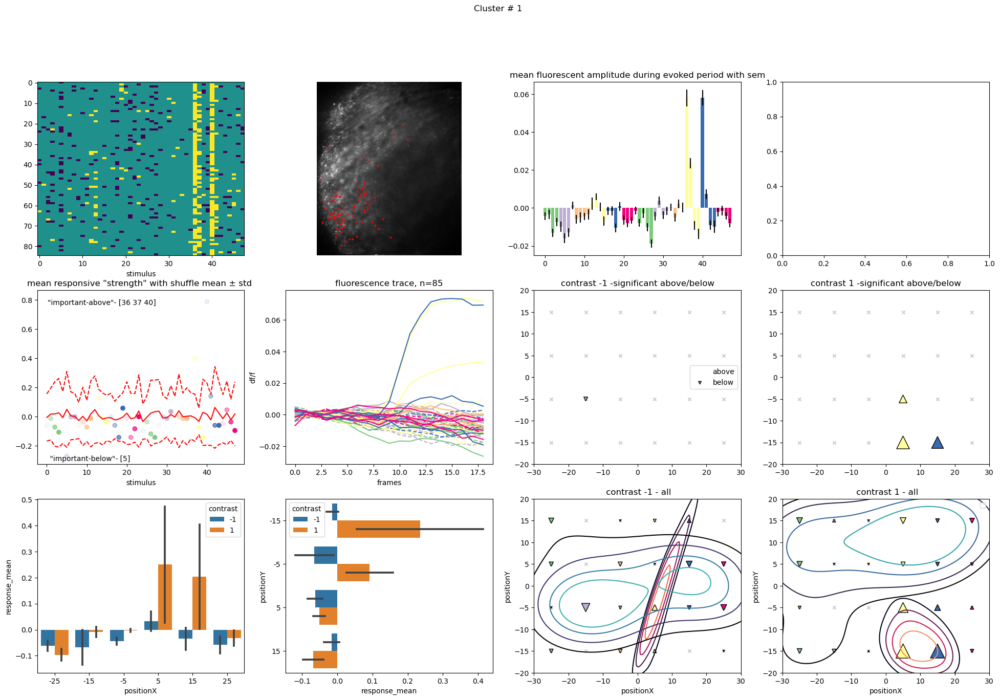

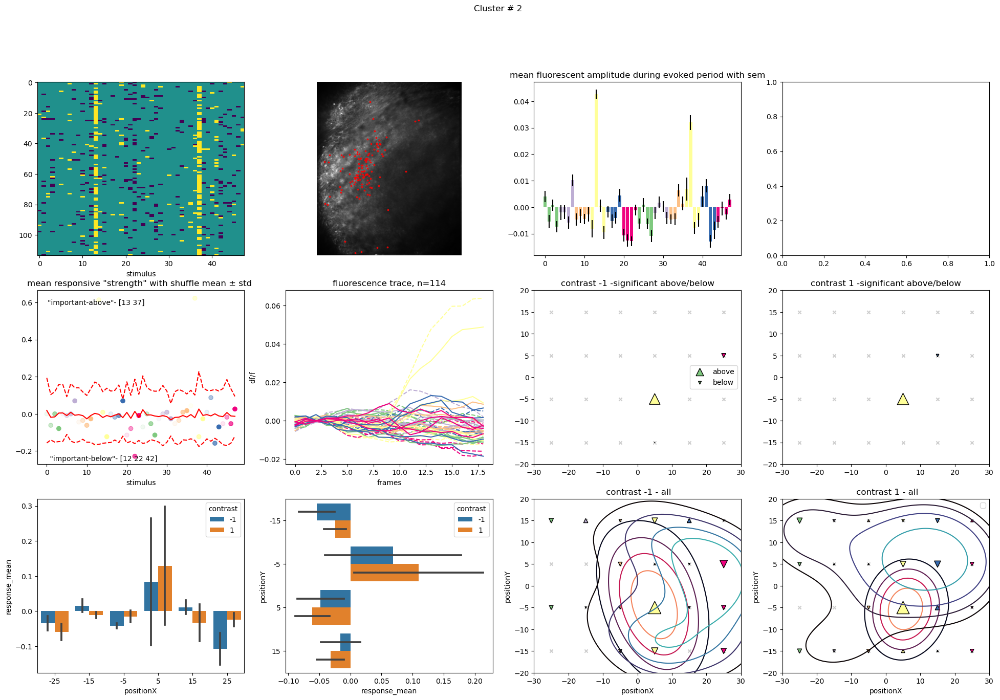

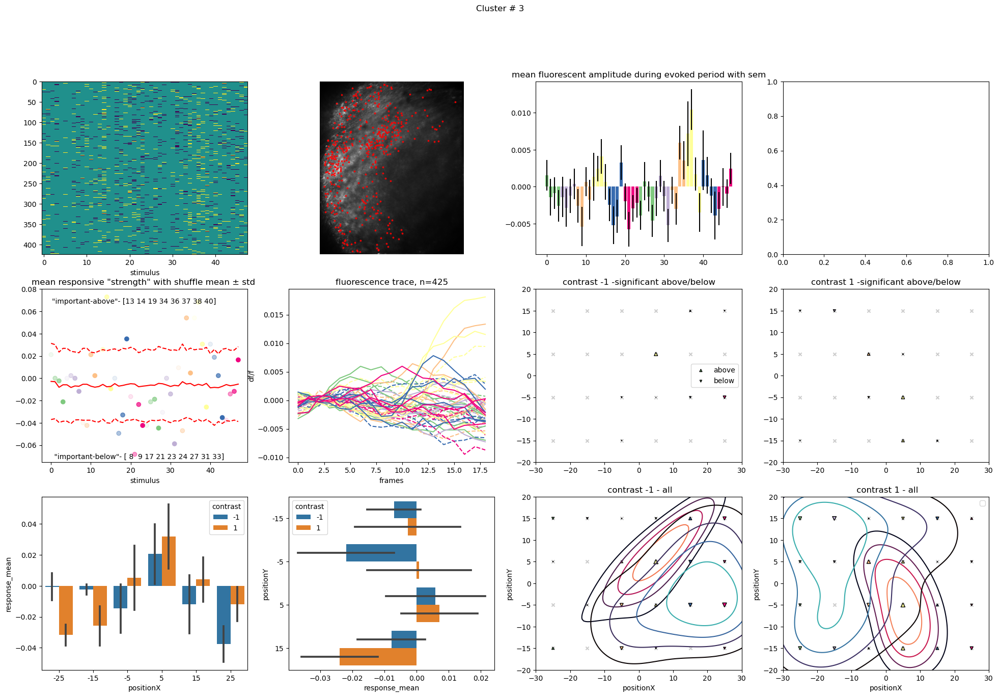

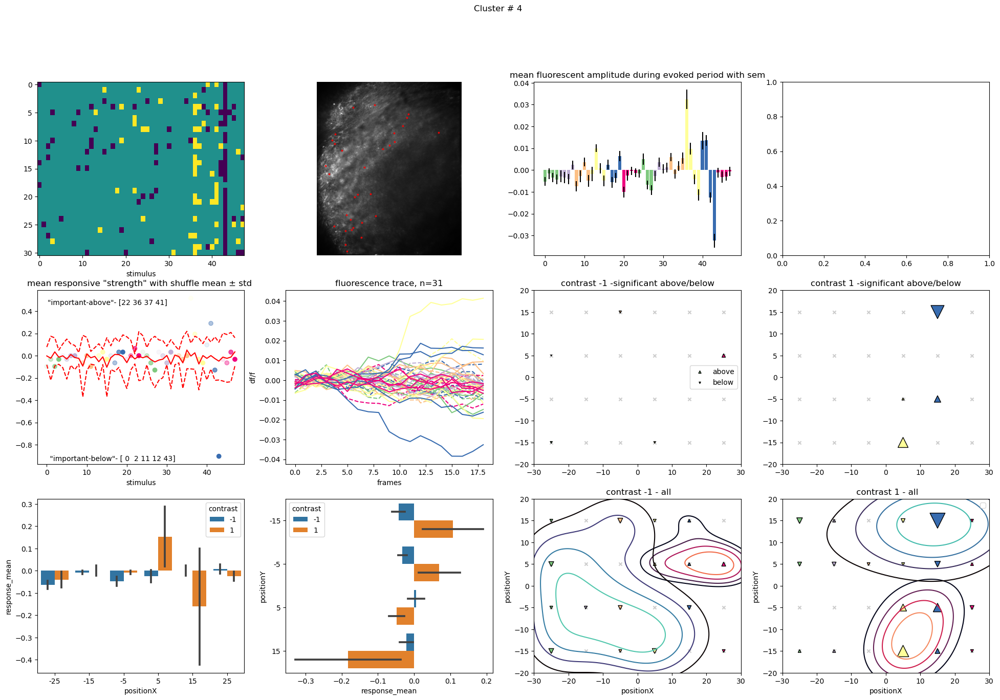

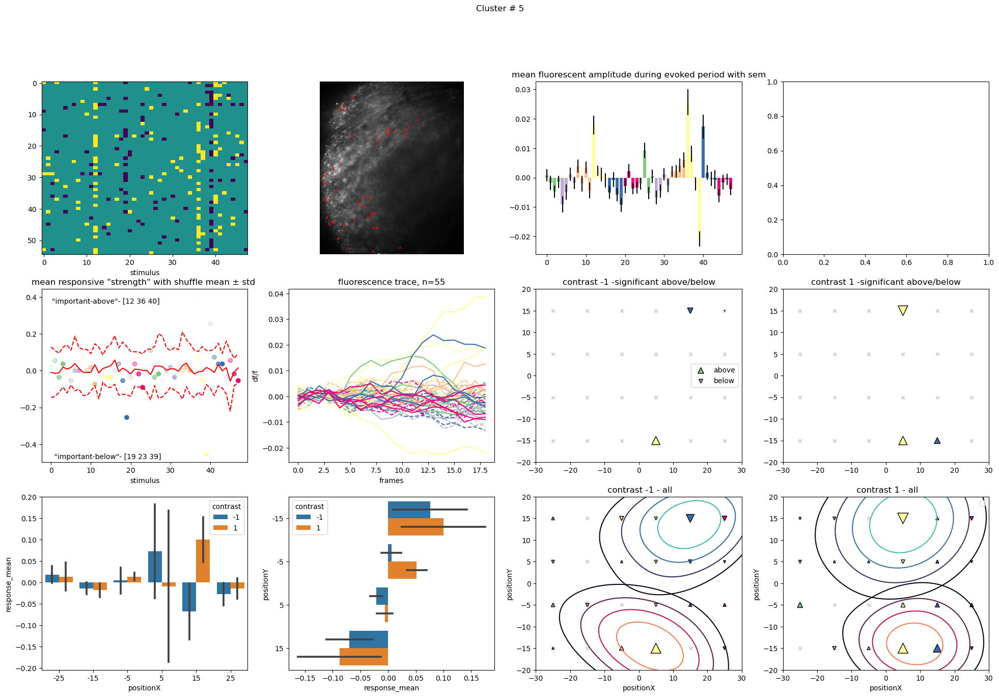

In [666]:

for i in range(1,big_cluster.max()+1):

    # prepare data for plotting
    cluster_cells= cellstat[big_cluster==i]
    cluster_response= cluster_input_responsive[big_cluster==i]
    cluster_celldfs= avg_stim_trace[big_cluster==i,:,:]
    n_permute=cluster_response.shape[0]  # permute nroi times (ie. if the cluster have 10 rois, then permute 10 times)..?
    
    chance_mean,chance_std= permute_cluster_response(cluster_response, n_permute)
    
    this_clusterpd= arrange_cluster_df(cluster_response, chance_mean,chance_std) 
    # prepare dataframe with stim info, mean and std of responses, calculate which responses are more important by comparing it with chance mean + or - chance std

    important_stimulus=[]
    important_stimulus.append(np.argwhere(this_clusterpd['care_sig_inc_weight']>0).flatten())# a stimulus is important if its 1 std (shuffled data) away from the mean of shuffled data
    important_stimulus.append(np.argwhere(this_clusterpd['care_sig_dec_weight']<0).flatten())
    
    fig, axs = plt.subplots(3,4, figsize=(24,15), height_ratios=[1,1,1], width_ratios=[3,3,3,3])
    # create subplots

    center_row= []
    center_col = []
    
    for j in cluster_cells:
        center_row.append( j['med'][0])
        center_col.append( j['med'][1])
    
    axs[0,0].imshow(cluster_response, aspect='auto', vmin=-1, vmax=1, interpolation='None')
    axs[0,0].set_xlabel('stimulus')

    
    axs[0,1].imshow(ops['meanImg'], cmap='gray')
    axs[0,1].scatter(center_col, center_row, s= 3, alpha= 0.8, color='r')
    axs[0,1].axis('off')

    plot_amp_ev(cluster_celldfs, evRange, axs=axs[0,2])
    axs[0,2].set_title('mean fluorescent amplitude during evoked period with sem')
    #sns.barplot(data=this_clusterpd, x='positionX',y='care_sig_dec_weight',hue= 'contrast', errorbar='se', ax= axs[0,3])
    #axs[0,2].set_ylim([0, 0.2])
    #axs[0,3].set_ylim([-0.2, 0])

    
    axs[1,0].scatter(xval, this_clusterpd['response_mean'], c=color_dict, alpha=alpha_dict)
    #axs[1,0].set_xticks(xval)
    axs[1,0].set_xlabel('stimulus')
    #axs[1,0].errorbar(xval, mean_cluster_response, yerr=std_cluster_response, marker='') # need to figure out how to make the error bar also hsv color

    axs[1,0].plot(chance_mean, color='r', linestyle='-') # plot mean and 2 std of data permuted x time- serve as a chance level control..?
    axs[1,0].plot(chance_mean + chance_std, color='r', linestyle='--')
    axs[1,0].plot(chance_mean - chance_std, color='r', linestyle='--')
    axs[1,0].set_title('mean responsive "strength" with shuffle mean ± std ')
    axs[1,0].text(0.05, 0.95, f'"important-above"- {important_stimulus[0]}', horizontalalignment='left', verticalalignment='top', transform=axs[1,0].transAxes)
    axs[1,0].text(0.05, 0.05, f' "important-below"- {important_stimulus[1]}', horizontalalignment='left', verticalalignment='top', transform=axs[1,0].transAxes)


    for k in range(0,cluster_celldfs.shape[2]):
        axs[1,1].plot(np.mean(cluster_celldfs[:,:, k], axis=0), label=f'stimulus # {k}',color= color_dict[k], linestyle= style_dict[k])
        axs[1,1].set_title(f'fluorescence trace, n={cluster_celldfs.shape[0]}')
    #axs[1,1].legend(loc='best', fontsize='x-small')
    axs[1,1].set_ylabel('df/f')
    axs[1,1].set_xlabel('frames')
    

    on_pd=this_clusterpd[this_clusterpd['contrast']==1]
    off_pd=this_clusterpd[this_clusterpd['contrast']==-1]
    
    plot_scatter_sig(off_pd,axs=axs[1,2])
    axs[1,2].legend()
    axs[1,2].set_title('contrast -1 -significant above/below')
    axs[1,2].set_xlim([-30, 30])
    axs[1,2].set_ylim([-20, 20])
    
    plot_scatter_sig(on_pd,axs=axs[1,3])
    axs[1,3].set_title('contrast 1 -significant above/below')
    axs[1,3].set_xlim([-30, 30])
    axs[1,3].set_ylim([-20, 20])
    

    plot_scatter_kde_all(off_pd, axs=axs[2,2])
    axs[2,2].set_title(' contrast -1 - all')
    axs[2,2].set_xlim([-30, 30])
    axs[2,2].set_ylim([-20, 20])
    
    
    plot_scatter_kde_all(on_pd,axs=axs[2,3])
    axs[2,3].legend()
    axs[2,3].set_title(' contrast 1 - all')
    axs[2,3].set_xlim([-30, 30])
    axs[2,3].set_ylim([-20, 20])
    

    sns.barplot(data=this_clusterpd, x='positionX',y='response_mean', hue='contrast', errorbar='se', ax=axs[2,0])
    sns.barplot(data=this_clusterpd, y='positionY',x='response_mean', hue='contrast', errorbar='se', orient='h', ax=axs[2,1])

    #fig.tight_layout()
    fig.suptitle(f'Cluster # {i}')


##### small test area for plotting

In [619]:
this_clusterpd.head()

,stim_id,positionX,positionY,contrast,response_mean,response_std,care_sig_inc_weight,care_sig_dec_weight
0,1,-25,-15,-1,0.018182,0.300963,0.0,0.0
1,2,-25,-5,-1,0.054545,0.296536,0.0,0.0
2,3,-25,5,-1,-0.036364,0.267217,0.0,0.0
3,4,-25,15,-1,0.036364,0.267217,0.0,0.0
4,5,-15,-15,-1,0.000000,0.000000,0.0,0.0


D:\Anaconda\envs\2p-analysis\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
D:\Anaconda\envs\2p-analysis\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
D:\Anaconda\envs\2p-analysis\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
D:\Anaconda\envs\2p-analysis\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN 

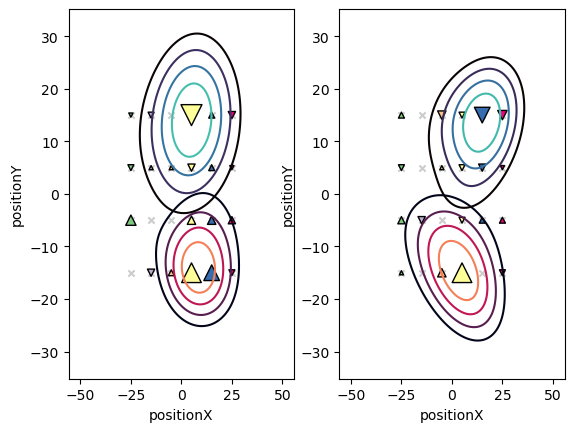

In [664]:
fig, ax = plt.subplots(1,2)

on_pd=this_clusterpd[this_clusterpd['contrast']==1]
plot_scatter_kde_all(on_pd, axs=ax[0])

off_pd=this_clusterpd[this_clusterpd['contrast']==-1]
plot_scatter_kde_all(off_pd, axs=ax[1])

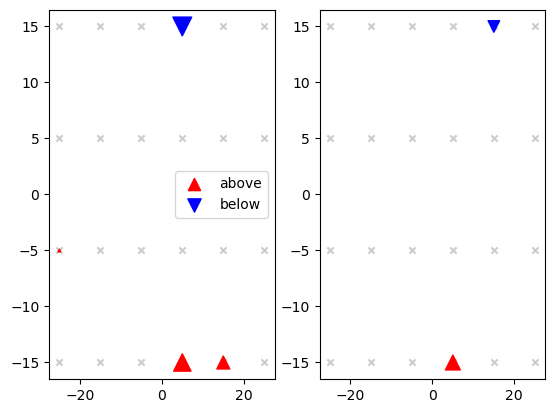

In [600]:
fig, ax = plt.subplots(1,2)
plot_scatter_sig(on_pd,axs=ax[0])
plot_scatter_sig(off_pd,axs=ax[1])
ax[0].legend()

In [650]:
stim_resp_amp=[]
stim_resp_sem=[]

for i in range(0, cluster_celldfs.shape[2]):
    cluster_fevmean=np.mean(cluster_celldfs[:,evRange, i], axis=1)
    # calculate mean fluorescent during the evoked frames for each units in this cluster
    
    stim_resp_amp.append(np.mean(cluster_fevmean))
    stim_resp_sem.append(np.std(cluster_fevmean)/np.sqrt(cluster_celldfs.shape[0]))


Text(0.5, 1.0, 'mean evoked response amplitude')

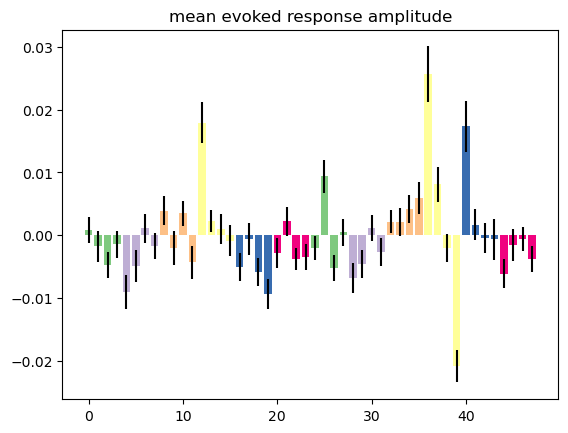

In [652]:
plt.bar(xval, stim_resp_amp, color=color_dict, yerr=stim_resp_std)
plt.title('mean evoked response amplitude')

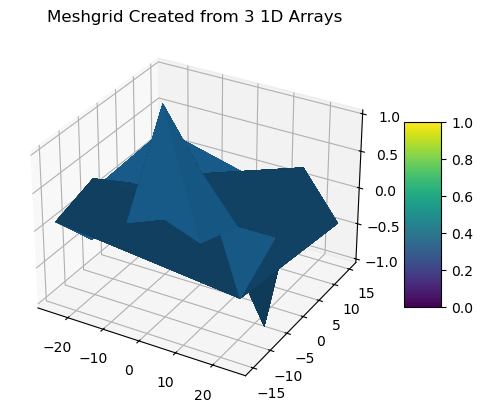

In [402]:
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import griddata

# project a 3d surface plot so stuff can go negative!
# probably not a very helpful visualization..

x1=this_clusterpd["positionX"]
y1=this_clusterpd["positionY"]

x2, y2 = np.meshgrid(x1, y1)
z2 = griddata((this_clusterpd["positionX"], this_clusterpd["positionY"]), this_clusterpd['response_mean'], (x2, y2), method='linear')

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(x2, y2, z2*5, rstride=1, cstride=1, linewidth=0, antialiased=True)
ax.set_zlim(-1.01, 1.01)

fig.colorbar(surf, shrink=0.5, aspect=5)
plt.title('Meshgrid Created from 3 1D Arrays')
# ~~~~ MODIFICATION TO EXAMPLE ENDS HERE ~~~~ #

plt.show()

In [368]:
Z.shape

(40, 40)

In [ ]:
# for orthogonal organization of input arrays

this_clusterpd= arrange_cluster_df(cluster_response, chance_mean,chance_std)

this_clusterpd

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(8,3))

sns.barplot(data=this_clusterpd, x='spatial_frequency',y='care_sig_inc_weight', errorbar='se', ax= axes[0])
sns.barplot(data=this_clusterpd, x='spatial_frequency',y='care_sig_dec_weight', errorbar='se', ax= axes[1])

fig.suptitle(f'Cluster # {i}')
fig.tight_layout()

# Need to fix the error bar here!

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12,4))

sns.barplot(data=this_clusterpd, x='spatial_frequency',y='response_mean', hue='orientation', errorbar='se', ax=axes[0])
sns.barplot(data=this_clusterpd, x='orientation',y='response_mean',hue='spatial_frequency', errorbar='se', ax=axes[1])

fig.suptitle(f'Cluster # {i}')
fig.tight_layout()

In [ ]:
# generate some sort of representation for these stimulus
center = [5, 3]
L = np.array([-5, 5]) # length of line
temp=this_clusterpd.groupby(by='orientation').sum().reset_index() # sum up weights that belong to the same orientation regardless of spatial frequency
cmap=cm['Accent'].colors

fig, axs = plt.subplots(1,2, figsize=(10,4))
#ax.set_aspect(1)
for i in range(0, len(temp)):
    phi = np.deg2rad(temp.iloc[i].orientation+90) # so that degree 0 is vertical 
    x = center[0] + np.cos(phi) * L
    y = center[1] + np.sin(phi) * L

    this_weight= temp.iloc[i]['care_sig_inc_weight']
    axs[0].plot(x, y, linewidth=this_weight*50, color=cmap[i],alpha=0.5,
                label=f'{temp.iloc[i].orientation}')
axs[0].set_title('What do the bars look like')

for i in range(0, len(temp)):
    
    this_x= temp.iloc[i].direction_x 
    this_y= temp.iloc[i].direction_y 

    this_weight= temp.iloc[i]['care_sig_inc_weight']

    axs[1].arrow(0,0,this_x,this_y, head_width=this_weight, linewidth=this_weight*20, color=cmap[i],
                 label=f'motion vector= {this_x,this_y}, orientation= {temp.iloc[i].orientation} ') 

axs[1].set_title(' motion direction')

fig.legend(bbox_to_anchor=(1.3,1), fontsize='small')   
fig.suptitle('cares about this stimulus by sig increase fluorescence')

In [ ]:
fig, axs = plt.subplots(1,2, figsize=(10,4))
#ax.set_aspect(1)
for i in range(0, len(temp)):
    phi = np.deg2rad(temp.iloc[i].orientation+90) # so that degree 0 is vertical 
    x = center[0] + np.cos(phi) * L
    y = center[1] + np.sin(phi) * L

    this_weight= temp.iloc[i]['care_sig_dec_weight']
    axs[0].plot(x, y, linewidth=this_weight*50, color=cmap[i],alpha=0.5,
                label=f'{temp.iloc[i].orientation}')
axs[0].set_title('What do the bars look like')

for i in range(0, len(temp)):
    
    this_x= temp.iloc[i].direction_x 
    this_y= temp.iloc[i].direction_y 

    this_weight= temp.iloc[i]['care_sig_dec_weight']

    axs[1].arrow(0,0,this_x,this_y, head_width=np.abs(this_weight), linewidth=np.abs(this_weight)*20, color=cmap[i],
                 label=f'motion vector= {this_x,this_y}, orientation= {temp.iloc[i].orientation} ') 

axs[1].set_title(' motion direction')

fig.legend(bbox_to_anchor=(1.3,1), fontsize='small')   
fig.suptitle('cares about this stimulus by sig decrease fluorescence')

#### low effort attempt to decoding stimulus based on neuron response

need to consider each stimulus in each repetition- otherwise too little # of observations


In [ ]:
# calculate mean fluorescence during the evoked window for each roi to each stimuli

evowindow_mean=np.mean(reorganized_trace[:,evRange,0:-1,:], axis=1) # exclude the last stimuli since its full field flash
print(evowindow_mean.shape)

reshaped_data= np.reshape(evowindow_mean, (evowindow_mean.shape[0],evowindow_mean.shape[1]*evowindow_mean.shape[2] ))
reshaped_data.shape # reshape data, using stimulus in each repetition to increase observation numbers

In [ ]:
sf_class=np.zeros((1, len(stim_detail)-1))
sf_class[0,stim_detail[stim_detail.spatial_frequency==0.01].index] =1
sf_class=np.repeat(sf_class, evowindow_mean.shape[2], axis=1) # repeat class label by number of reptitions

sf_class.shape

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X= reshaped_data.T # exclude the last stimuli since its full field flash
y= sf_class.T

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y.ravel(), test_size = 0.2, random_state = 0)

In [ ]:
# check the shape of X_train and X_test

X_train.shape, X_test.shape

In [ ]:
# feature scaling

from sklearn.preprocessing import StandardScaler


scaler = StandardScaler()

X_train = scaler.fit_transform(X_train)

X_test = scaler.transform(X_test)

In [ ]:
# import SVC classifier
from sklearn.svm import SVC


# import metrics to compute accuracy
from sklearn.metrics import accuracy_score


# instantiate classifier with default hyperparameters
svc=SVC() 


# fit classifier to training set
svc.fit(X_train,y_train)


# make predictions on test set
y_pred=svc.predict(X_test)


# compute and print accuracy score
print('Model accuracy score with default hyperparameters: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

In [ ]:
# plot ROC Curve

from sklearn.metrics import roc_curve

fpr, tpr, thresholds = roc_curve(y_test, y_pred)

plt.figure(figsize=(6,4))

plt.plot(fpr, tpr, linewidth=2)

plt.plot([0,1], [0,1], 'k--' )

plt.rcParams['font.size'] = 12

plt.title('ROC curve ')

plt.xlabel('False Positive Rate (1 - Specificity)')

plt.ylabel('True Positive Rate (Sensitivity)')

plt.show()

In [ ]:
# compute ROC AUC

from sklearn.metrics import roc_auc_score

ROC_AUC = roc_auc_score(y_test, y_pred)

print('ROC AUC : {:.4f}'.format(ROC_AUC))

## Working with registered binary files

normalize each image by median (control for dye loading), then calculate evoked df/f (normalized)
Very large values are clipped ( any values > 1 = 1 and any values < -1 = -1)

In [ ]:
ops['reg_file']

In [ ]:
stackshape= (ops['nframes'],ops['Ly'],ops['Lx'] )
frames=np.memmap(ops['reg_file'], mode= 'r+', dtype= 'int16', shape= stackshape)
# reading registered image frames... 

In [ ]:
# calculating median frame used to normalize dye loading
frames_median= np.median(frames, axis=0)

# normalize median frame into range 0 and 1 to use as weight for multiplying
img_weight= minmax_scale(frames_median.flatten()).reshape(frames_median.shape)
# need to flatten first since the minmax scale only calculates along one dimension

fig, axs = plt.subplots(1,2, figsize=(10,5))
im=axs[0].imshow(frames_median)
plt.colorbar(im, shrink= 0.8)
axs[0].set_title('median image used to control dye loading')

im=axs[1].imshow(img_weight)
plt.colorbar(im, shrink=0.8)
axs[1].set_title('normalized median image as weights')

In [ ]:
reorganized_stack= np.zeros((ops['Ly'],ops['Lx'], np.max(stim_id), int(reps)))
# create storage to store mean images at a given stimulus at a given repetition
print(f'image stack reorganized to {reorganized_stack.shape}, with y, x, stim_id, repitition ')

In [ ]:
offset= -10 
# hard coded in matlab version, give 10 frames buffer in front of each cycle

baseRange=range(0,5)
# take the first five frame as the baseline

evRange= range(9,19)
# take the 9th through 19th frame as evoked activity

print('reorganizing now..')
for count, element in enumerate(tqdm(np.unique(stim_id))):
    for j in range(0, int(reps)):
        
        this_pd= stim_pd[(stim_pd['stim_id']==element) & (stim_pd['stim_rep']==j)]
        this_frames= frames[this_pd['stim_start'].values[0]+ offset: this_pd['stim_end'].values[0]+ offset,:,:]- frames_median
        # grab relevant frames for a given stimulus at a given repetition, subtract the median off from each frame

        dff_evoked= (np.nanmean(this_frames[evRange, :,:], axis=0) - np.nanmean(this_frames[baseRange,:,:], axis=0))/np.nanmean(this_frames[baseRange,:,:], axis=0)
        # calculate mean dff evoked response by using evoked frame ranges and baseline frame ranges
        
        reorganized_stack[:,:,count,j]= dff_evoked
        # store into storage
        

### Plot mean evoked response for every stimulus at every repetition

In [ ]:
reorganized_stack[reorganized_stack<-1] =-1
reorganized_stack[reorganized_stack>1] =1
# clip very large and very small values


In [ ]:
# mean evoked response for each repetition, weighted by median frame (control for dye loading, so that dark region remain dark)

fig, axs = plt.subplots(nstim,int(reps),figsize=(32, 96))

for i in range(0, int(reps)):
    for j in range(0, nstim):
        im=axs[j,i].imshow(reorganized_stack[:,:,j,i]*img_weight, vmin=-0.5, vmax=0.5,cmap='coolwarm'  )
        axs[j,i].set_title(f'stimulus# {j}, repitition{i}')
        axs[j,i].axis('off')
        
plt.colorbar(im)
plt.subplots_adjust(hspace= 0.1,wspace= 0.1)
plt.suptitle('weighted mean evoked response- for each repetition ', fontsize=20)
# adjust the spacings between subplots
#plt.savefig('test.pdf', bbox_inches='tight')
#LOOP

#### Mean evoked response (averaged over all repetition) for each stimulus

In [ ]:
stim_mean_stack= np.mean(reorganized_stack, axis=3)
print(stim_mean_stack.shape)
# matrix storing mean evoked response for each stimulus across all repetitions

In [ ]:
fig, axs = plt.subplots(3,6,figsize=(32, 24)) # grid for the 4x6 stimulus is actually 4x6 for ON +4x6 for OFF - > total of 8x6; grid for grating stimulus is 2 sf x 8direction = 16 +1 full field -> total of 17
axs= np.ravel(axs) # flattens the axis for easier indexing

for j in range(0, nstim):
    im= axs[j].imshow(stim_mean_stack[:,:,j]*img_weight, vmin=-0.5, vmax=0.5,cmap='coolwarm' )
    axs[j].set_title(f'stimulus# {j}')
    axs[j].axis('off')

axs = np.reshape(axs, (3,6))
plt.colorbar(im)
plt.subplots_adjust(hspace= 0.1,wspace= 0.1)
plt.suptitle('weighted mean evoked response- averaged over repetition', fontsize= 20)
# adjust the spacings between subplots
#plt.savefig('test.pdf', bbox_inches='tight')
#LOOP

### comparisons between stimulus

#### Gratings

In [ ]:
# comparisons between stimulus
# in the 8 way grating stimulus, we have 8 orientations(bars moving in 8 different directions ie, L to R or R to L are two directions) and 2 spatial frequencies
# could compare between spatial frequency for the same orientation 
# could also compare same spatial frequency for the same bar stimulus but moving at different directions (ie O and 180)
# could also compare same spatial frequency for two different orientation (ie. 0 and 90)

__id_list 1 and 2 defined under section__
> ##### Associating stimulus id onto ACTUAL stimulus parameter_

More stimulus pairs/groups to come..

In [ ]:
fig, axs = plt.subplots(2,int(len(id_list1)/2),figsize=(16, 8))
axs= np.ravel(axs) # flattens the axis for easier indexing

for count,item in enumerate(id_list1):
    low_high= stim_mean_stack[:,:,item[0]]- stim_mean_stack[:,:,item[1]]
    # low spatial frequency mean image minus high spatial frequency mean image
    im=axs[count].imshow(low_high*img_weight,vmin=-0.25, vmax= 0.25, cmap='coolwarm') 
    axs[count].set_title(f'orientation {stim_detail.iloc[item[1]].orientation}')
    axs[count].axis('off')

fig.colorbar(im, ax=axs[count], shrink=0.8, cmap='coolwarm')

axs = np.reshape(axs, (2, int(len(id_list2)/2)))
plt.subplots_adjust(hspace= 0.1,wspace= 0.1)
fig.suptitle('weighted low sf - high sf for a given stimulus',  fontsize=32)

In [ ]:
fig, axs = plt.subplots(2,int(len(id_list2)/2),figsize=(16, 8))

axs= np.ravel(axs) # flattens the axis for easier indexing
for count,item in enumerate(id_list2):
    difference= stim_mean_stack[:,:,item[1]]- stim_mean_stack[:,:,item[0]]
    # orientations that are 180 apart- opposite motion direction

    this_orientation= stim_detail.iloc[item[1]].orientation
    this_frequency= stim_detail.iloc[item[1]].spatial_frequency
    
    im= axs[count].imshow(difference*img_weight,vmin=-0.2, vmax= 0.2, cmap='coolwarm') 
    axs[count].set_title(f'ori{this_orientation} - {this_orientation-180} , sf {this_frequency}')

    axs[count].axis('off')

fig.colorbar(im, ax=axs[count], shrink=0.8, cmap='coolwarm')


axs = np.reshape(axs, (2, int(len(id_list2)/2)))
plt.subplots_adjust(hspace= 0.1,wspace= 0.1)
fig.suptitle('comparing orientation 180 degrees apart',  fontsize=32)

### 4x6 retinotopy

### plot responsive roi location accorind to x center and y center
WORK IN PROGRESS

In [ ]:
WORK IN PROGRESS
# plot ROI location on mean image based on the stimulus x  position that they show significance to
fig, axs = plt.subplots(1,len(np.unique(positionX)),figsize=(16,9))

for count,item in enumerate(np.unique(positionX)):
    these_cells=np.zeros_like(responsive)
    # initialize ndarray to hold responsive cells
    
    for j in stim_detail[stim_detail['positionX']==item].index:
        these_cells[np.argwhere(responsive[:,j])]=1

    responsive_cells= cellstat[np.argwhere(np.sum(these_cells,axis=1))]
    
    center_row= []
    center_col = []
    for k in responsive_cells:
        center_row.append( k[0]['med'][0])
        center_col.append( k[0]['med'][1])
    
    axs[count].imshow(ops['meanImg'], cmap='gray')
    axs[count].set_title(f'x position = {item}')
    axs[count].scatter(center_col, center_row, s= 3, alpha= 0.8)


In [ ]:
WORK IN PROGRESS

# plot ROI location on mean image based on the stimulus y  position that they show significance to
fig, axs = plt.subplots(1,len(np.unique(positionY)),figsize=(16,9))

for count,item in enumerate(np.unique(positionY)):
    these_cells=np.zeros_like(responsive)
    # initialize ndarray to hold responsive cells
    
    for j in stim_detail[stim_detail['positionY']==item].index:
        these_cells[np.argwhere(responsive[:,j])]=1

    responsive_cells= cellstat[np.argwhere(np.sum(these_cells,axis=1))]
    
    center_row= []
    center_col = []
    for k in responsive_cells:
        center_row.append( k[0]['med'][0])
        center_col.append( k[0]['med'][1])
    
    axs[count].imshow(ops['meanImg'], cmap='gray')
    axs[count].set_title(f'y position = {item}')
    axs[count].scatter(center_col, center_row, s= 3, alpha= 0.8)

## test areas